import ast 
ast.literal_eval(results.loc[0, 'best parameters'])

https://scikit-learn.org/stable/modules/model_evaluation.html#multimetric-scoring

https://scikit-learn.org/stable/modules/grid_search.html#multimetric-grid-search

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.GradientBoostingRegressor.html#sklearn.ensemble.GradientBoostingRegressor

https://mljar.com/blog/feature-importance-in-random-forest/

https://www.datatechnotes.com/2019/09/how-to-use-gridsearchcv-in-python.html

# Import Libraries

In [1]:
import warnings
warnings.filterwarnings("ignore")

from dataprep.eda import create_report

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.neighbors import KNeighborsRegressor

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from imblearn.pipeline import Pipeline

Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
NumExpr defaulting to 8 threads.


In [2]:
# Turn off scientific notation
pd.options.display.float_format = '{:.2f}'.format

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 100)

In [3]:
#predict = ['Cycle Total']
#scalers = ['NA', 'Standard']
#imputers = ['KNN']
#splitSizes = [0.30]
#models = ['KNN']
predict = ['Pedestrian Total', 'Cycle Total']
models = ['KNN', 'Ridge', 'RandomForest']
imputers = ['KNN', 'Pandas']
splitSizes = [0.50, 0.30, 0.10]
scalers = ['NA', 'Standard']

# Pedestrian Counts

In [4]:
# Pedestrian Counts
# 2019 Counts
pedCount2019 = pd.read_excel('dcc-2019-pedestrian-footfall-count-jan-dec_14082020.xlsx')
pedCount2019 = pedCount2019.resample('60min', on='Time').sum()
pedCount2019.reset_index(inplace=True)
pedCount2019.rename(columns={'Time':'date'}, inplace=True)

# 2020 Counts
pedCount2020 = pd.read_csv('jan-dec-2020-ped-data.csv')
pedCount2020.rename(columns={'Date & Time':'date'}, inplace=True)

# 2021 Counts
pedCount2021 = pd.read_csv('2021-jan-dec-dcc-footfall.csv')
pedCount2021.rename(columns={'Date and Time':'date'}, inplace=True)

In [5]:
# Convert object to datetime
pedCount2019.date = pd.to_datetime(pedCount2019.date)
pedCount2020.date = pd.to_datetime(pedCount2020.date)
pedCount2021.date = pd.to_datetime(pedCount2021.date)

In [6]:
# Merge two datasets into one
pedCount= pd.concat([pedCount2019, pedCount2020])
pedCount.reset_index(drop=True, inplace=True)
pedCount

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Mary Street,Capel Street,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Dame Street,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Dawson Street,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Capel Street - Removed from site 20/10,Dame Street (Counter Missing)
0,2019-01-01 00:00:00,1504.00,1914.00,163.00,238.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,255.00,881.00,1988.00,140.00,0.00,0.00,0.00,NaN,NaN
1,2019-01-01 01:00:00,1187.00,885.00,102.00,173.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,209.00,723.00,1270.00,215.00,0.00,0.00,0.00,NaN,NaN
2,2019-01-01 02:00:00,1233.00,984.00,63.00,121.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,193.00,1010.00,1589.00,210.00,0.00,0.00,0.00,NaN,NaN
3,2019-01-01 03:00:00,1316.00,935.00,59.00,174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,178.00,772.00,1534.00,204.00,0.00,0.00,0.00,NaN,NaN
4,2019-01-01 04:00:00,802.00,390.00,46.00,82.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,35.00,197.00,610.00,88.00,0.00,0.00,0.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,NaN,NaN,11.00,255.00,700.00,1399.00,121.00,NaN,1757.00,244.00,62.00,234.00,1013.00,70.00,NaN,194.00,296.00,136.00,204.00,123.00,97.00,NaN,NaN
17540,2020-12-31 20:00:00,200.00,207.00,NaN,NaN,30.00,204.00,325.00,1515.00,81.00,NaN,949.00,197.00,29.00,153.00,1377.00,44.00,NaN,153.00,274.00,85.00,91.00,64.00,59.00,NaN,NaN
17541,2020-12-31 21:00:00,155.00,148.00,NaN,NaN,139.00,191.00,533.00,1285.00,129.00,NaN,1303.00,123.00,31.00,164.00,271.00,38.00,NaN,86.00,288.00,94.00,85.00,71.00,48.00,NaN,NaN
17542,2020-12-31 22:00:00,149.00,142.00,NaN,NaN,162.00,179.00,478.00,886.00,120.00,NaN,1024.00,92.00,10.00,139.00,213.00,35.00,NaN,66.00,168.00,82.00,44.00,62.00,35.00,NaN,NaN


In [7]:
# Count missing values... some counters are not there from 2019 to 2020
pedCount.isna().sum()

date                                                   0
O'Connell St Outside Pennys                            1
O'Connell St Outside Clerys                            1
Mary Street                                         5353
Capel Street                                        8784
Aston Quay                                             1
Grafton Street @ CompuB                                1
Talbot Street North                                    1
Doilier Street, Burgh Quay                             1
Dawson Street Replacement                              1
Dame Street                                         8784
Talbot Street South                                    1
O'Connell St, Parnell St @ AIB                         1
Grafton Street / Nassau Street / Suffolk Street        1
College Green, Bank Of Ireland                         1
Henry Street                                         853
Westmoreland Street East                               1
Dawson Street                  

In [8]:
# Drop the columns that no longer have counters and Mary Street that has loads of Na's almost all of 2020
pedCount.drop(columns=['Dame Street (Counter Missing)', 
                     'Capel Street - Removed from site 20/10',
                    'Dawson Street','Capel Street','Dame Street',
                    'Mary Street'],inplace=True)

In [9]:
# verify how much missing data and will deal with later
pedCount.isna().sum()

date                                                  0
O'Connell St Outside Pennys                           1
O'Connell St Outside Clerys                           1
Aston Quay                                            1
Grafton Street @ CompuB                               1
Talbot Street North                                   1
Doilier Street, Burgh Quay                            1
Dawson Street Replacement                             1
Talbot Street South                                   1
O'Connell St, Parnell St @ AIB                        1
Grafton Street / Nassau Street / Suffolk Street       1
College Green, Bank Of Ireland                        1
Henry Street                                        853
Westmoreland Street East                              1
Liffey Street                                         1
Westmoreland Street West                              1
Grafton Street                                     4587
Bachelors Walk                                  

In [10]:
# Sort values to ensure date in time are in order
pedCount.sort_values('date',inplace=True)
pedCount

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
0,2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00
1,2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00
2,2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00
3,2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00
4,2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00
17540,2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00
17541,2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00
17542,2020-12-31 22:00:00,149.00,142.00,162.00,179.00,478.00,886.00,120.00,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00


In [11]:
# Had to rename columns to match previous years dataset
pedCount2021.rename(columns={'Date and Time':'date', 
                             "O\'Connell St/Pennys Pedestrian": "O'Connell St Outside Pennys",
                             "O\'Connell st/Princes st North": "O'Connell St Outside Clerys",
                             "Aston Quay/Fitzgeralds": 'Aston Quay',
                             'Grafton Street/CompuB': 'Grafton Street @ CompuB',
                             "Talbot st/Murrays Pharmacy": 'Talbot Street North',
                             "D\'olier st/Burgh Quay": 'Doilier Street, Burgh Quay',
                             "Dawson Street/Molesworth": 'Dawson Street Replacement',
                             "Talbot st/Guineys": 'Talbot Street South',
                             "O\'Connell St/Parnell St/AIB": "O'Connell St, Parnell St @ AIB",
                             "Grafton Street / Nassau Street / Suffolk Street": 'Grafton Street / Nassau Street / Suffolk Street',
                             "College Green/Bank Of Ireland": 'College Green, Bank Of Ireland',
                             "Henry Street/Coles Lane/Dunnes": 'Henry Street',
                             "Westmoreland Street East/Fleet street": 'Westmoreland Street East',
                             "Liffey st/Halfpenny Bridge": 'Liffey Street',
                             "Westmoreland Street West/Carrolls":'Westmoreland Street West',
                             "Grafton st/Monsoon":'Grafton Street', 
                             "Bachelors walk/Bachelors way":'Bachelors Walk',
                             "College Green/Church Lane":'College Green @ Church Lane',
                             "College st/Westmoreland st": 'College Green - Dame St Side'
                            }, inplace=True)

# Filter out only columns from previous year's dataset
pedCount2021 = pedCount2021[pedCount.columns.values]
pedCount2021.sort_values('date',inplace=True)
pedCount2021.reset_index(drop=True, inplace=True)
pedCount2021

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
0,2021-01-01 00:00:00,137.00,125.00,165.00,111.00,525.00,793.00,45.00,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00
1,2021-01-01 01:00:00,53.00,51.00,25.00,42.00,1204.00,448.00,10.00,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00
2,2021-01-01 02:00:00,49.00,38.00,27.00,25.00,1837.00,262.00,8.00,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00
3,2021-01-01 03:00:00,30.00,12.00,16.00,15.00,2996.00,88.00,6.00,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00
4,2021-01-01 04:00:00,24.00,12.00,16.00,17.00,3621.00,40.00,11.00,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,NaN,807.00,NaN,832.00,0.00,736.00,145.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00
8756,2021-12-31 20:00:00,NaN,884.00,NaN,740.00,0.00,784.00,184.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00
8757,2021-12-31 21:00:00,NaN,513.00,NaN,413.00,0.00,499.00,75.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00
8758,2021-12-31 22:00:00,NaN,385.00,NaN,344.00,0.00,357.00,43.00,1522.00,181.00,53.00,841.00,1401.00,86.00,NaN,543.00,1428.00,690.00,225.00,106.00


# Dublin Bike Count

In [12]:
# Import 2019 data and convert column name to date
cycleCount2019 = pd.read_csv('popen-data-dublinkeddatacycle-counter-datajan-dec-2019-cycle.csv')
cycleCount2019.rename(columns={'Date and Time':'date'}, inplace=True)
# Import 2020 data and convert column name to date
cycleCount2020 = pd.read_csv('jan-dec-2020-cycle-data.csv')
cycleCount2020.rename(columns={'Date & Time':'date'}, inplace=True)
# Import 2021 Cycle Data
cycleCount2021 = pd.read_csv('2021-dublin-city-cycle-counts-31122021.csv')
cycleCount2021.rename(columns={'Date & Time':'date',
                              'Drumcondra Cyclists 1' : 'Guild Street'}, inplace=True)

In [13]:
cycleCount2021

,date,Charleville Mall,Charleville Mall Cyclist IN,Charleville Mall Cyclist OUT,Clontarf - James Larkin Rd,Clontarf - James Larkin Rd Cyclist IN,Clontarf - James Larkin Rd Cyclist OUT,Clontarf - Pebble Beach Carpark,Clontarf - Pebble Beach Carpark Cyclist IN,Clontarf - Pebble Beach Carpark Cyclist OUT,Guild Street,Drumcondra Cyclists 1 Cyclist IN,Drumcondra Cyclists 1 Cyclist OUT,Drumcondra Cyclists 2,Drumcondra Cyclists 2 Cyclist IN,Drumcondra Cyclists 2 Cyclist OUT,Griffith Avenue (Clare Rd Side),Griffith Avenue (Clare Rd Side) Cyclist IN,Griffith Avenue (Clare Rd Side) Cyclist OUT,Griffith Avenue (Lane Side),Griffith Avenue (Lane Side) Cyclist IN,Griffith Avenue (Lane Side) Cyclist OUT,Grove Road Totem,Grove Road Totem OUT,Grove Road Totem IN,North Strand Rd N/B,North Strand Rd S/B,Richmond Street Cyclists 1,Richmond Street Cyclists 1 Cyclist IN,Richmond Street Cyclists 1 Cyclist OUT,Richmond Street Cyclists 2,Richmond Street Cyclists 2 Cyclist IN,Richmond Street Cyclists 2 Cyclist OUT
0,01-01-2021 00:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,3.00,0.00,3.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,4.00,1.00,2.00,0.00,6.00,0.00,6.00,3.00,0.00,3.00
1,01-01-2021 01:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,2.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,4.00,2.00,2.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00
2,01-01-2021 02:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,7.00,5.00,2.00,0.00,0.00,2.00,0.00,2.00,3.00,0.00,3.00
3,01-01-2021 03:00:00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,1.00,0.00,1.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,5.00,3.00,2.00,0.00,0.00,1.00,0.00,1.00,3.00,0.00,3.00
4,01-01-2021 04:00:00,3.00,3.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,2.00,0.00,2.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,6.00,6.00,0.00,0.00,2.00,4.00,0.00,4.00,1.00,0.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,31-12-2021 19:00:00,8.00,5.00,3.00,4.00,2.00,2.00,13.00,10.00,3.00,0.00,0.00,0.00,4.00,4.00,0.00,2.00,2.00,0.00,0.00,0.00,0.00,57.00,29.00,28.00,29.00,14.00,45.00,0.00,45.00,57.00,0.00,57.00
8756,31-12-2021 20:00:00,5.00,3.00,2.00,6.00,2.00,4.00,15.00,7.00,8.00,0.00,0.00,0.00,6.00,6.00,0.00,4.00,4.00,0.00,0.00,0.00,0.00,70.00,42.00,28.00,26.00,16.00,52.00,0.00,52.00,46.00,0.00,46.00
8757,31-12-2021 21:00:00,6.00,2.00,4.00,7.00,5.00,2.00,9.00,5.00,4.00,0.00,0.00,0.00,2.00,2.00,0.00,2.00,2.00,0.00,0.00,0.00,0.00,44.00,27.00,17.00,21.00,18.00,31.00,0.00,31.00,21.00,0.00,21.00
8758,31-12-2021 22:00:00,3.00,1.00,2.00,6.00,2.00,4.00,6.00,2.00,4.00,0.00,0.00,0.00,0.00,0.00,0.00,2.00,2.00,0.00,0.00,0.00,0.00,19.00,14.00,5.00,11.00,2.00,21.00,0.00,21.00,17.00,1.00,16.00


In [14]:
# Convert objects to datetime
cycleCount2019.date = pd.to_datetime(cycleCount2019.date)
cycleCount2020.date = pd.to_datetime(cycleCount2020.date)
cycleCount2021.date = pd.to_datetime(cycleCount2021.date)

# Keep 2019 columns only
cycleCount2020 = cycleCount2020[cycleCount2019.columns]

In [15]:
# Concat dataframes one on top of the other
cycleCount = pd.concat([cycleCount2019, cycleCount2020])

# Reset index
cycleCount.reset_index(drop=True, inplace=True)

# Make sure values are in cronological order
cycleCount.sort_values(by='date', inplace=True)

# Have to drop Guild Street to match 2021 dataset
cycleCount.drop(columns=['Guild Street'])

,date,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall
0,2019-01-01 00:00:00,12.00,4.00,16.00,1.00
1,2019-01-01 01:00:00,17.00,8.00,14.00,1.00
2,2019-01-01 02:00:00,18.00,9.00,9.00,2.00
3,2019-01-01 03:00:00,18.00,5.00,15.00,1.00
4,2019-01-01 04:00:00,12.00,3.00,8.00,1.00
...,...,...,...,...,...
17538,2020-12-31 19:00:00,55.00,9.00,5.00,2.00
17539,2020-12-31 20:00:00,34.00,2.00,11.00,0.00
17540,2020-12-31 21:00:00,22.00,2.00,11.00,3.00
17541,2020-12-31 22:00:00,24.00,7.00,9.00,3.00


In [16]:
# Count Na's and I am happy with this amount
cycleCount.isna().sum()

date                    0
Grove Road Totem       17
North Strand Rd S/B    15
North Strand Rd N/B    15
Charleville Mall       15
Guild Street           16
dtype: int64

In [17]:
# Keep columns in previous year's dataset
cycleCount2021 = cycleCount2021[cycleCount.columns]
#cycleCount2021 = cycleCount.resample('60min', on='date').sum()
cycleCount2021.sort_values('date',inplace=True)
cycleCount2021.reset_index(drop=True, inplace=True)

# Weather

## Define Weather Columns

rain : Rain will be output in millimetres (mm).

temp : temprature in celsius

dewpt : dew point temprature: This is the temperature at which the air would become saturated. If it equals the actual temperature (TTT) we have 100% humidity so rain, mist, fog or low cloud.

vappr : water vapor for humidity

rhum : Relative humidity has a maximum value of 100 percent.

msl : mean sea level pressure (hPa). Pressure is given in units of hPa.

https://data.gov.ie/dataset/met-eireann-weather-forecast-api


In [18]:
# Import hourly weather data
hourlyWeather = pd.read_csv('hly175.csv', 
                parse_dates=['date'],
                usecols=['date','rain','temp','dewpt','vappr','rhum','msl']).query("date >= '2019-01-01'")

# Ensure data is in crolological order
hourlyWeather.sort_values('date',inplace=True)

hourlyWeather = hourlyWeather.astype({'rain': 'float', 'temp': 'float', 'dewpt': 'float',
             'vappr':'float', 'rhum':'float', 'msl':'float'})

hourlyWeather.reset_index(drop=True,inplace=True)

#hourlyWeather.replace(',', '', regex=True, inplace=True)
hourlyWeather

,date,rain,temp,dewpt,vappr,rhum,msl
0,2019-01-01 00:00:00,0.00,9.60,5.60,9.10,76.00,1035.10
1,2019-01-01 01:00:00,0.00,8.60,5.30,8.90,79.00,1035.10
2,2019-01-01 02:00:00,0.00,8.30,5.30,8.90,81.00,1034.90
3,2019-01-01 03:00:00,0.00,9.10,5.80,9.20,79.00,1035.50
4,2019-01-01 04:00:00,0.00,9.20,5.90,9.30,79.00,1035.70
...,...,...,...,...,...,...,...
27716,2022-02-28 20:00:00,0.00,2.90,0.90,6.50,86.00,1025.50
27717,2022-02-28 21:00:00,0.00,1.90,0.60,6.40,91.00,1026.30
27718,2022-02-28 22:00:00,0.00,0.80,-0.20,6.00,93.00,1027.20
27719,2022-02-28 23:00:00,0.00,0.70,0.00,6.10,94.00,1027.60


In [19]:
hourlyWeather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27721 entries, 0 to 27720
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    27721 non-null  datetime64[ns]
 1   rain    27721 non-null  float64       
 2   temp    27721 non-null  float64       
 3   dewpt   27721 non-null  float64       
 4   vappr   27721 non-null  float64       
 5   rhum    27721 non-null  float64       
 6   msl     27721 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 1.5 MB


# EDA

In [20]:
cycleCols = ['Grove Road Totem', 'North Strand Rd S/B',
       'North Strand Rd N/B', 'Charleville Mall', 'Guild Street']
pedCols = ["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",
       'Aston Quay', 'Grafton Street @ CompuB', 'Talbot Street North',
       'Doilier Street, Burgh Quay', 'Dawson Street Replacement',
       'Talbot Street South', "O'Connell St, Parnell St @ AIB",
       'Grafton Street / Nassau Street / Suffolk Street',
       'College Green, Bank Of Ireland', 'Henry Street',
       'Westmoreland Street East', 'Liffey Street', 'Westmoreland Street West',
       'Grafton Street', 'Bachelors Walk', 'College Green @ Church Lane',
       'College Green - Dame St Side']
weatherCols = ['rain', 'temp', 'dewpt', 'vappr', 'rhum', 'msl']

## Weather

In [21]:
hourlyWeather.describe()

,rain,temp,dewpt,vappr,rhum,msl
count,27721.00,27721.00,27721.00,27721.00,27721.00,27721.00
mean,0.09,10.21,6.85,10.35,80.42,1013.39
std,0.39,5.12,4.58,3.25,12.73,13.23
min,0.00,-5.10,-7.50,3.50,21.00,961.80
25%,0.00,6.60,3.40,7.80,73.00,1004.70
50%,0.00,10.00,6.70,9.80,83.00,1014.90
75%,0.00,13.90,10.30,12.50,91.00,1022.60
max,12.80,27.70,19.00,22.00,100.00,1048.00


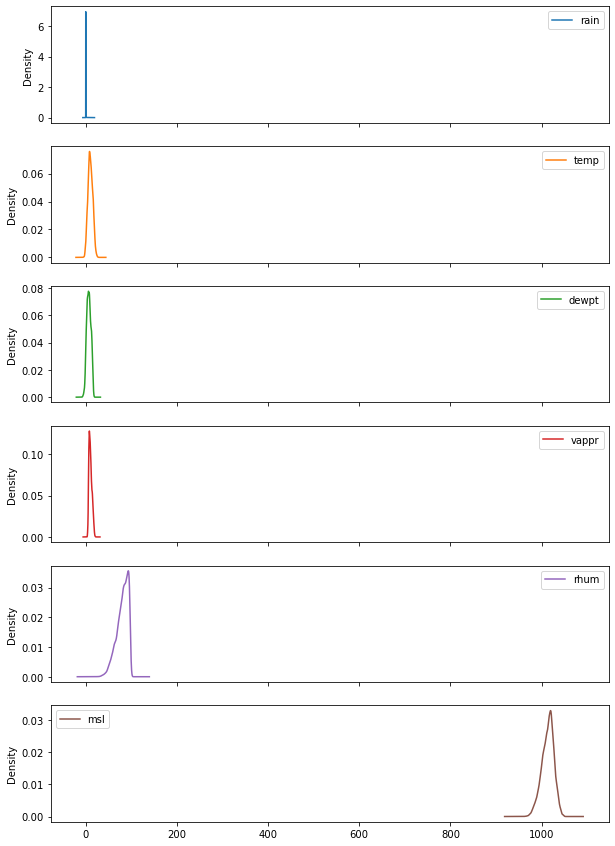

In [22]:
hourlyWeather[weatherCols].plot(kind='density', subplots=True, figsize=(10,15));

<AxesSubplot:>

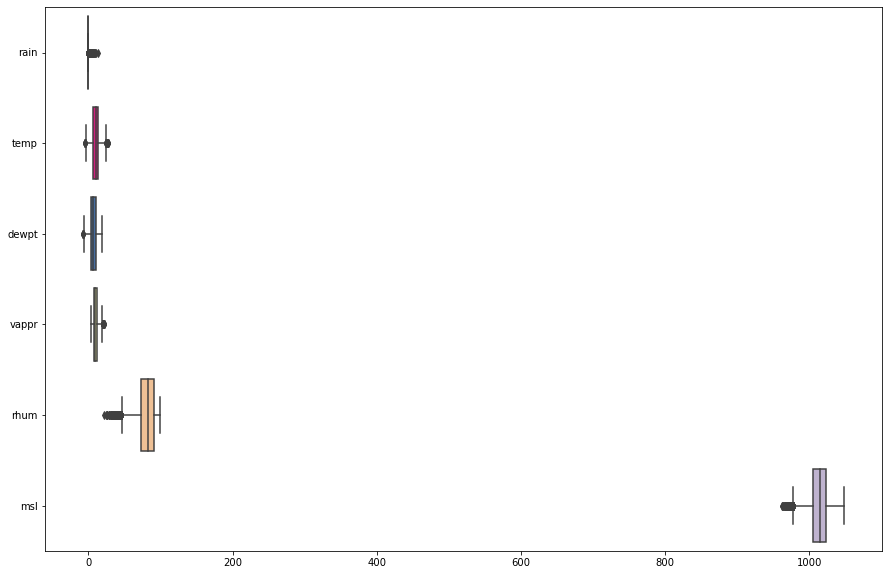

In [23]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=hourlyWeather, orient='h', palette='Accent_r')

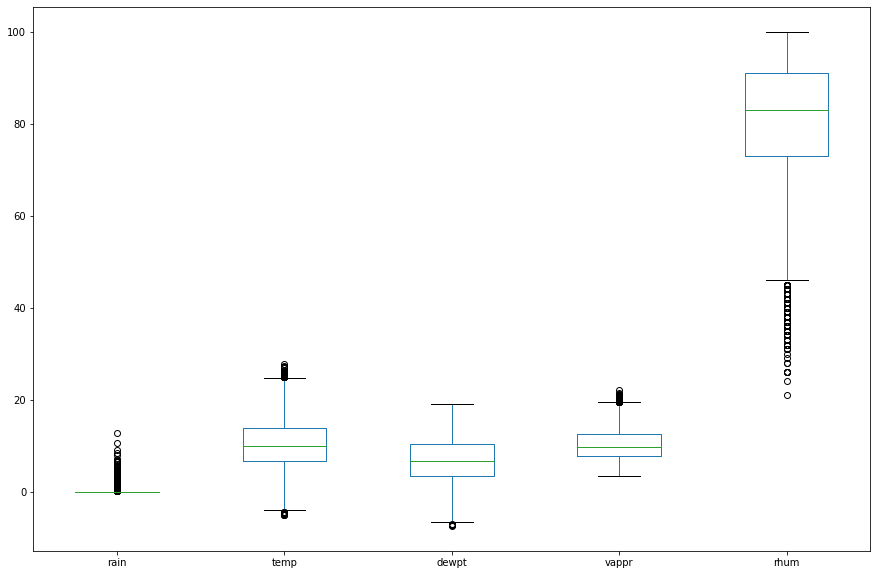

In [24]:
hourlyWeather[['rain', 'temp', 'dewpt', 'vappr', 'rhum']].plot.box(figsize=(15,10));

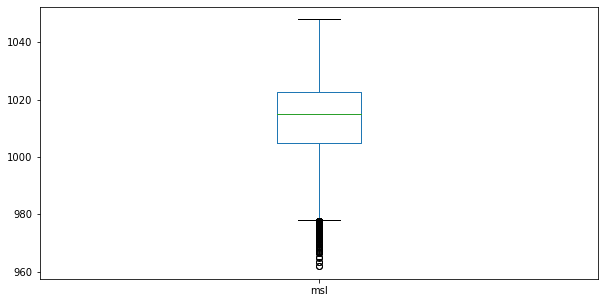

In [25]:
hourlyWeather.msl.plot.box(figsize=(10,5));

In [26]:
hourlyWeatherEDA = hourlyWeather.copy()
hourlyWeatherEDA['hour'] = hourlyWeatherEDA.date.dt.hour
hourlyWeatherEDA['Day of Week'] = hourlyWeatherEDA.date.dt.day_name()
hourlyWeatherEDA['Day'] = hourlyWeatherEDA.date.dt.dayofweek
hourlyWeatherEDA['Season'] = (hourlyWeatherEDA.date.dt.month%12 // 3  + 1)
hourlyWeatherEDA.sort_values('Day', inplace=True)
hourlyWeatherEDA.set_index('date', inplace=True)
hourlyWeatherEDA

,rain,temp,dewpt,vappr,rhum,msl,hour,Day of Week,Day,Season
date,,,,,,,,,,
2020-12-21 23:00:00,0.00,3.30,2.50,7.30,94.00,1005.80,23,Monday,0,1
2019-06-17 03:00:00,0.00,9.70,8.20,10.90,90.00,1009.80,3,Monday,0,3
2019-06-17 02:00:00,0.10,9.50,8.40,11.00,92.00,1009.80,2,Monday,0,3
2019-06-17 01:00:00,0.00,9.90,8.90,11.40,93.00,1009.60,1,Monday,0,3
2019-06-17 00:00:00,0.00,10.00,9.10,11.60,94.00,1009.50,0,Monday,0,3
...,...,...,...,...,...,...,...,...,...,...
2019-03-03 11:00:00,0.40,5.40,2.80,7.50,83.00,992.90,11,Sunday,6,2
2019-03-03 12:00:00,1.40,4.70,2.80,7.40,87.00,991.10,12,Sunday,6,2
2019-03-03 13:00:00,2.20,3.80,2.20,7.20,89.00,988.90,13,Sunday,6,2


### Weather Day

In [27]:
weatherDay = hourlyWeatherEDA.groupby(by='Day').agg({'rain': 'sum', 'temp': 'mean',
                                         'dewpt': 'mean','vappr':'mean',
                                         'rhum':'mean', 'msl':'mean'})
weatherDay.index = ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday','Sunday']
weatherDay

,rain,temp,dewpt,vappr,rhum,msl
Monday,290.10,10.01,6.63,10.18,80.41,1014.46
Tuesday,363.10,10.44,7.12,10.54,80.66,1014.04
Wednesday,347.00,10.26,7.01,10.47,80.93,1013.76
Thursday,328.10,10.32,7.09,10.54,81.04,1013.14
Friday,284.80,10.27,6.86,10.39,80.15,1012.92
Saturday,373.60,10.24,6.74,10.25,79.68,1012.53
Sunday,377.30,9.94,6.50,10.10,80.08,1012.90


### Weather Hour

In [29]:
weatherHour = hourlyWeatherEDA.groupby(by='hour').agg({'rain': 'sum', 'temp': 'mean',
                                         'dewpt': 'mean','vappr':'mean',
                                         'rhum':'mean', 'msl':'mean'})
weatherHour

,rain,temp,dewpt,vappr,rhum,msl
hour,,,,,,
0,95.60,8.67,6.54,10.12,86.38,1013.67
1,95.10,8.53,6.50,10.09,86.98,1013.53
2,96.20,8.37,6.42,10.04,87.47,1013.38
3,110.30,8.20,6.35,9.99,87.96,1013.25
4,102.90,8.09,6.29,9.94,88.28,1013.12
5,117.10,8.09,6.32,9.97,88.50,1013.11
6,113.40,8.30,6.49,10.10,88.24,1013.18
7,104.10,8.84,6.71,10.26,86.56,1013.30
8,93.70,9.52,6.89,10.39,83.94,1013.46


In [30]:
weatherHour.describe()

,rain,temp,dewpt,vappr,rhum,msl
count,24.00,24.00,24.00,24.00,24.00,24.00
mean,98.50,10.21,6.85,10.35,80.42,1013.39
std,15.36,1.74,0.35,0.25,6.93,0.23
min,63.10,8.09,6.29,9.94,69.60,1013.04
25%,94.75,8.64,6.53,10.12,73.69,1013.20
50%,98.60,9.80,6.88,10.38,82.04,1013.38
75%,106.05,11.94,7.17,10.58,86.66,1013.60
max,130.60,12.90,7.30,10.67,88.50,1013.71


### Weather Seasons

In [32]:
seasonDay = hourlyWeatherEDA.groupby(by=['Season','hour']).agg({'rain': 'sum', 'temp': 'mean',
                                         'dewpt': 'mean','vappr':'mean',
                                         'rhum':'mean', 'msl':'mean'})
seasonDay.reset_index(inplace=True)
seasonDay.index= seasonDay.hour
#seasonDay.drop(columns='hour', inplace=True)

seasonDay.Season = seasonDay.Season.map({1:'Winter',2:'Spring', 3:'Summer', 4:'Autumn'})
seasonDay

,Season,hour,rain,temp,dewpt,vappr,rhum,msl
hour,,,,,,,,
0,Winter,0,25.00,5.57,3.32,7.94,85.42,1011.50
1,Winter,1,26.30,5.52,3.30,7.93,85.61,1011.35
2,Winter,2,36.60,5.47,3.23,7.90,85.58,1011.16
3,Winter,3,40.90,5.38,3.19,7.87,85.82,1011.09
4,Winter,4,37.60,5.32,3.15,7.85,85.94,1010.90
5,Winter,5,40.70,5.36,3.21,7.87,85.98,1010.79
6,Winter,6,41.40,5.32,3.24,7.89,86.37,1010.76
7,Winter,7,35.50,5.35,3.29,7.92,86.54,1010.81
8,Winter,8,34.00,5.41,3.33,7.95,86.53,1010.97


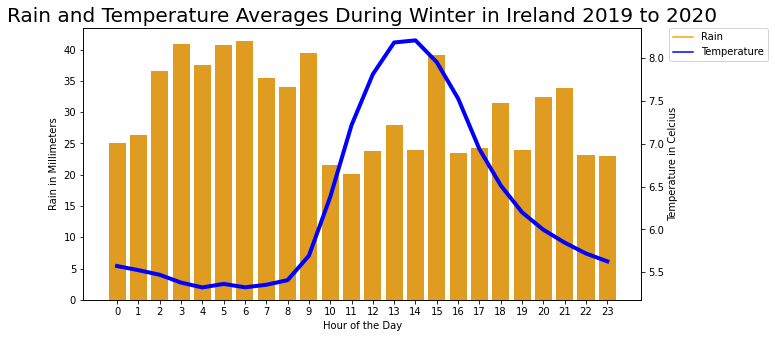

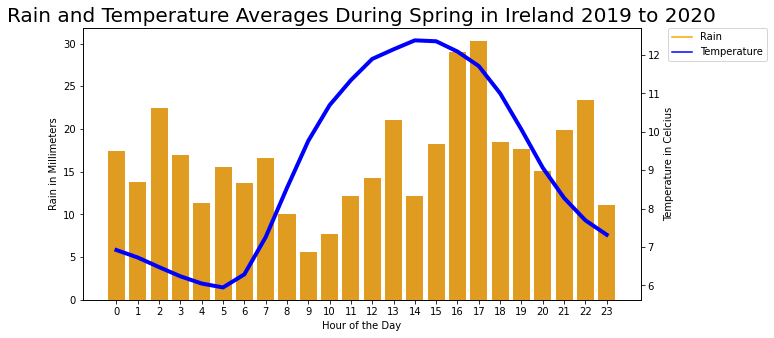

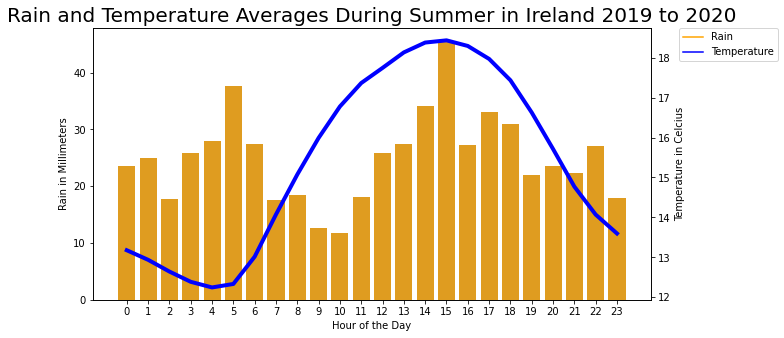

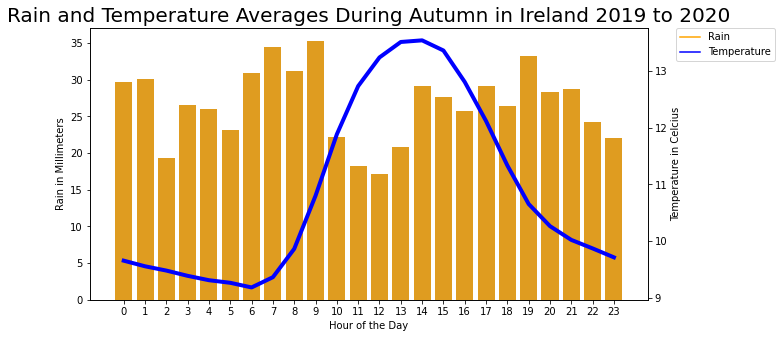

In [33]:
seasons = ['Winter', 'Spring', 'Summer', 'Autumn']
#https://stackoverflow.com/questions/47591650/second-y-axis-time-series-seaborn
from matplotlib.lines import Line2D

for sea in seasons:
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1 = sns.barplot(x='hour', y='rain', 
        data= seasonDay[['rain','hour']][seasonDay.Season == sea], color='orange')
    ax1.set(xlabel='Hour of the Day', ylabel='Rain in Millimeters')
    ax1.grid(False)
    ax2 = ax1.twinx()
    sns.lineplot(x='hour', y='temp', 
        data=seasonDay[['temp','hour']][seasonDay.Season == sea], ax=ax2,
                linewidth=4, color='blue')
    # https://www.programcreek.com/python/example/96215/seaborn.set
    ax2.set(ylabel='Temperature in Celcius')
    plt.title(label= 'Rain and Temperature Averages During '+ sea+' in Ireland 2019 to 2020', 
              fontsize=20)
    plt.legend(handles=[Line2D([], [], color="orange", label='Rain'), 
                        Line2D([], [], color="blue", label='Temperature')], fontsize=10,
              bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
    
    plt.show();

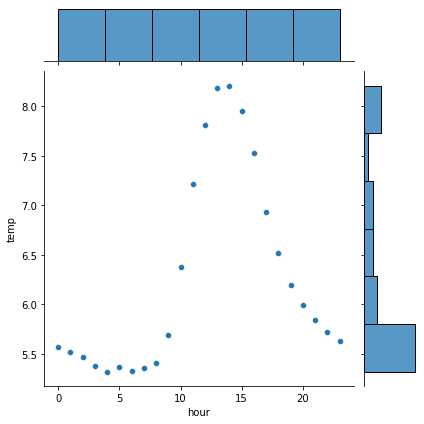

In [36]:
sns.jointplot(data=seasonDay[~seasonDay.index.duplicated()], x='hour', y='temp');

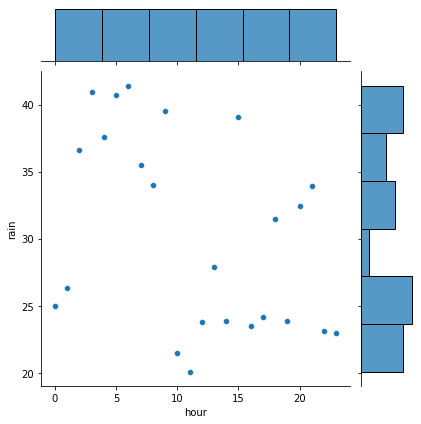

In [37]:
sns.jointplot(data=seasonDay[~seasonDay.index.duplicated()], x='hour', y='rain');

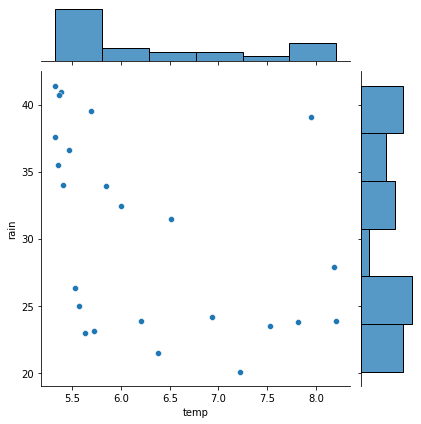

In [38]:
sns.jointplot(data=seasonDay[~seasonDay.index.duplicated()], x='temp', y='rain');

## Pedestrian

In [39]:
pedCount.describe()

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
count,17543.00,17543.00,17543.00,17543.00,17543.00,17543.00,17543.00,17543.00,17543.00,17543.00,17543.00,16691.00,17543.00,17543.00,17543.00,12957.00,17444.00,17543.00,17543.00
mean,1040.76,753.10,848.45,1346.15,575.25,622.25,70.36,1316.84,481.61,279.07,534.46,1409.40,362.15,589.60,807.22,1018.98,409.27,508.66,463.86
std,1051.97,667.38,887.02,1363.72,1140.82,619.37,107.41,2164.29,491.04,331.02,536.23,1633.40,368.28,667.36,634.97,1067.10,934.03,557.16,544.79
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,160.00,145.00,169.00,165.00,38.00,146.00,0.00,89.00,47.00,23.00,97.00,86.00,57.00,67.00,224.50,163.00,20.00,44.50,36.00
50%,630.00,558.00,627.00,890.00,154.00,512.00,7.00,898.00,315.00,145.00,371.00,658.00,218.00,319.00,734.00,609.00,106.00,278.00,238.00
75%,1720.00,1292.00,1113.00,2343.00,480.00,913.00,117.00,1627.00,825.00,412.00,830.00,2432.00,607.00,926.00,1254.00,1579.00,564.00,874.00,741.00
max,4809.00,3798.00,4953.00,12188.00,10729.00,5995.00,2207.00,18483.00,2141.00,2455.00,4632.00,13212.00,2852.00,4700.00,4941.00,5427.00,11253.00,2392.00,4147.00


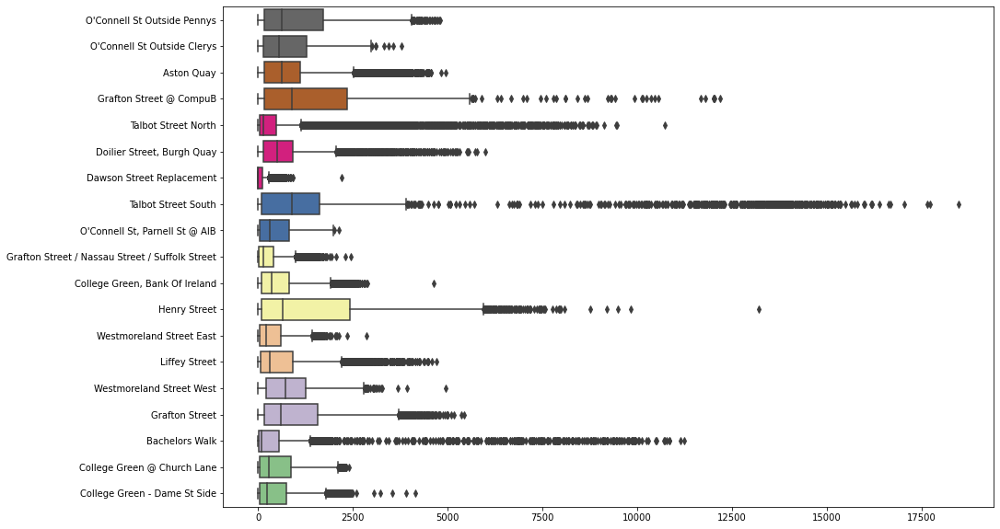

In [40]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=pedCount, orient='h', palette='Accent_r');

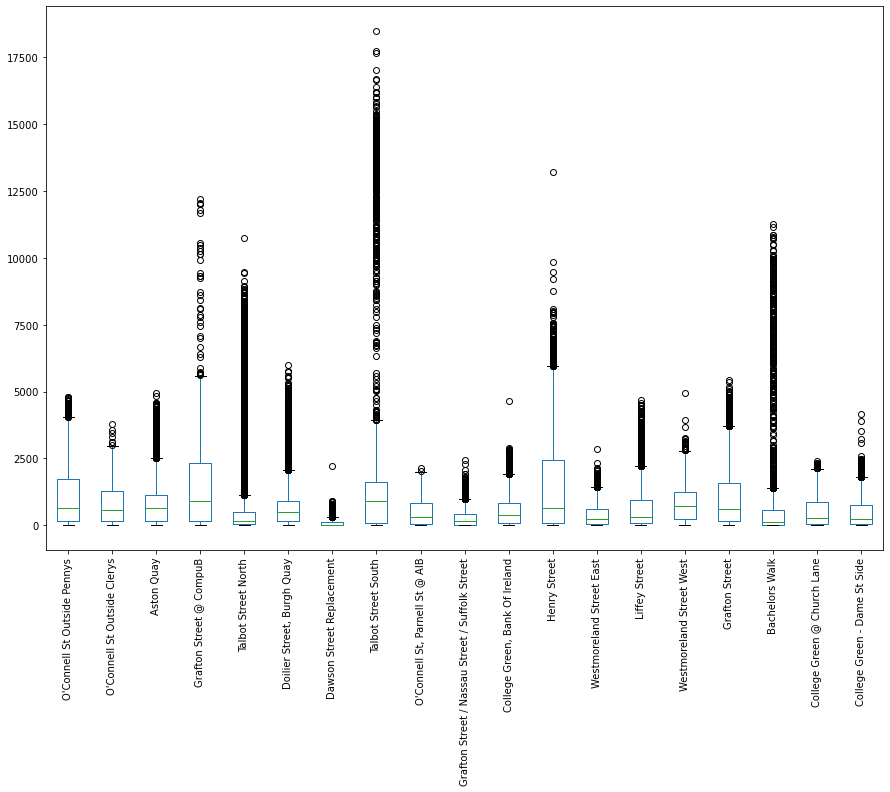

In [41]:
pedCount.plot.box(figsize=(15,10))
plt.xticks(rotation=90);

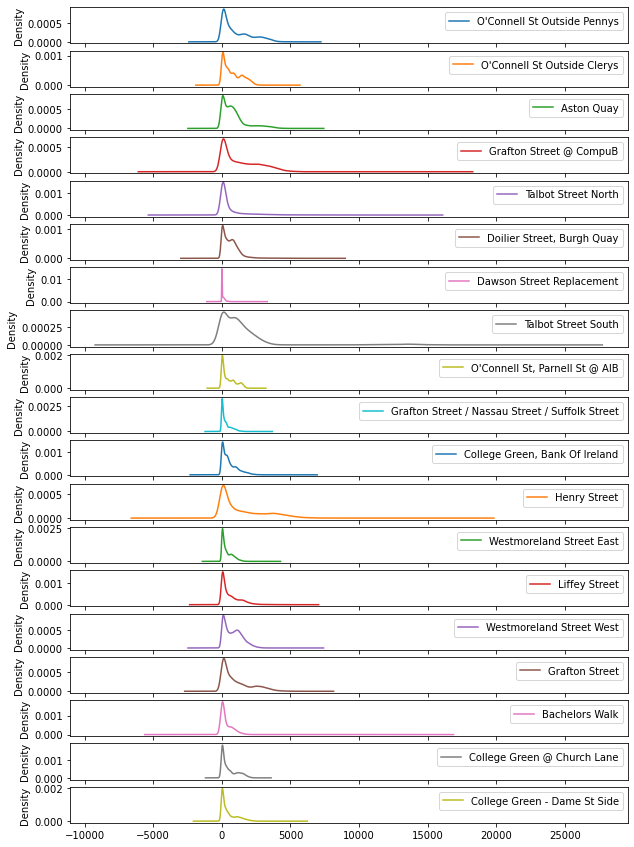

In [42]:
pedCount[pedCols].plot(kind='density', subplots=True, figsize=(10,15));

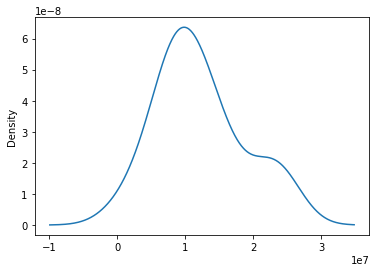

In [43]:
pedCount.sum().plot(kind='density');

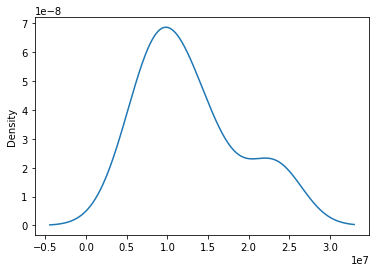

In [44]:
pedCount[["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",
       'Aston Quay', 'Grafton Street @ CompuB', 'Talbot Street North',
       'Doilier Street, Burgh Quay', 'Talbot Street South', "O'Connell St, Parnell St @ AIB",
       'Grafton Street / Nassau Street / Suffolk Street',
       'College Green, Bank Of Ireland', 'Henry Street',
       'Westmoreland Street East', 'Liffey Street', 'Westmoreland Street West',
       'Grafton Street', 'Bachelors Walk', 'College Green @ Church Lane',
       'College Green - Dame St Side']].sum().plot(kind='density')

plt.show();

In [45]:
pedCountEDA = pedCount.copy()
pedCountEDA['hour'] = pedCountEDA.date.dt.hour
pedCountEDA['Day of Week'] = pedCountEDA.date.dt.day_name()
pedCountEDA['Day'] = pedCountEDA.date.dt.dayofweek
pedCountEDA.set_index('date', inplace=True)
pedCountEDA.sort_values('Day',inplace=True)
pedCountEDA

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,hour,Day of Week,Day
date,,,,,,,,,,,,,,,,,,,,,,
2020-05-18 18:00:00,422.00,360.00,824.00,269.00,851.00,177.00,126.00,67.00,441.00,112.00,461.00,945.00,101.00,173.00,382.00,175.00,14.00,147.00,145.00,18,Monday,0
2019-04-01 10:00:00,2070.00,1366.00,750.00,1252.00,2408.00,801.00,0.00,693.00,874.00,536.00,1186.00,2539.00,729.00,2250.00,1107.00,1546.00,962.00,1076.00,1021.00,10,Monday,0
2019-04-01 11:00:00,2361.00,1433.00,885.00,1483.00,1985.00,790.00,0.00,806.00,1038.00,617.00,1332.00,3114.00,729.00,2256.00,893.00,2171.00,900.00,1069.00,900.00,11,Monday,0
2019-04-01 12:00:00,2881.00,1770.00,1111.00,2027.00,2954.00,1039.00,0.00,1084.00,1245.00,702.00,1710.00,3920.00,874.00,1559.00,1217.00,3057.00,813.00,1542.00,1245.00,12,Monday,0
2019-04-01 13:00:00,3483.00,1987.00,1365.00,2825.00,5190.00,1237.00,0.00,1505.00,1508.00,897.00,1890.00,4320.00,1203.00,2305.00,1585.00,3858.00,974.00,1804.00,1525.00,13,Monday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-17 17:00:00,3139.00,1733.00,1799.00,4174.00,179.00,667.00,0.00,1531.00,1210.00,528.00,738.00,0.00,737.00,1582.00,2427.00,3183.00,1008.00,1278.00,838.00,17,Sunday,6
2019-11-17 16:00:00,3434.00,1674.00,2161.00,4197.00,207.00,595.00,0.00,1783.00,1323.00,643.00,838.00,0.00,668.00,1851.00,2594.00,3755.00,919.00,1453.00,918.00,16,Sunday,6
2019-11-17 15:00:00,3524.00,1709.00,3061.00,3983.00,200.00,713.00,0.00,1496.00,1389.00,712.00,843.00,0.00,699.00,2011.00,2686.00,3975.00,928.00,1411.00,1008.00,15,Sunday,6


### Pedestrian Day

In [46]:
pedDay = pedCountEDA.groupby(by='Day of Week').mean()
pedDay.sort_values('Day', inplace=True)
pedDay.drop(columns=['hour','Day'], inplace=True)
pedDay

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
Day of Week,,,,,,,,,,,,,,,,,,,
Monday,1007.70,737.87,832.38,1312.01,559.62,607.66,68.71,1302.31,475.70,270.88,495.70,1339.54,353.73,561.02,765.79,947.09,388.32,489.97,450.31
Tuesday,1006.71,751.24,872.26,1320.44,538.97,605.10,69.73,1242.25,486.56,285.30,497.39,1394.72,373.26,557.60,783.61,994.40,403.34,509.29,487.96
Wednesday,1043.06,769.89,839.78,1317.29,625.05,641.49,73.09,1299.13,491.00,283.03,520.06,1486.02,381.23,568.38,776.48,956.20,397.66,509.44,487.80
Thursday,1118.91,808.26,841.55,1436.46,623.90,665.97,77.03,1301.99,511.66,303.49,544.51,1523.17,392.34,613.09,804.81,1078.22,412.85,541.77,522.72
Friday,1147.40,834.14,886.84,1491.36,638.04,676.73,71.32,1343.27,517.83,315.95,598.76,1460.39,414.08,654.74,854.15,1103.16,453.22,571.26,534.56
Saturday,1097.70,748.07,869.76,1360.72,550.72,605.49,71.83,1279.69,478.71,276.18,580.75,1449.54,344.13,635.35,874.36,1112.83,427.73,519.18,423.46
Sunday,863.31,621.50,796.46,1184.40,489.84,552.88,60.76,1450.31,409.39,218.29,504.41,1211.78,275.68,537.27,791.84,942.22,381.26,419.35,339.15


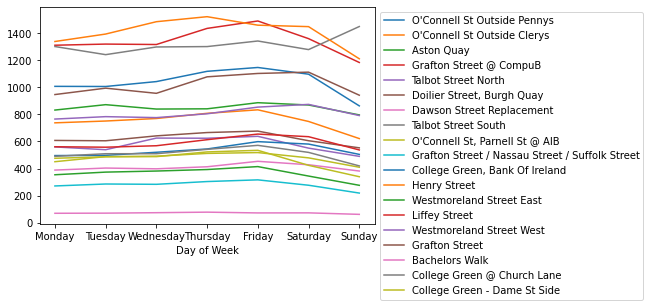

In [47]:
pedDay.plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

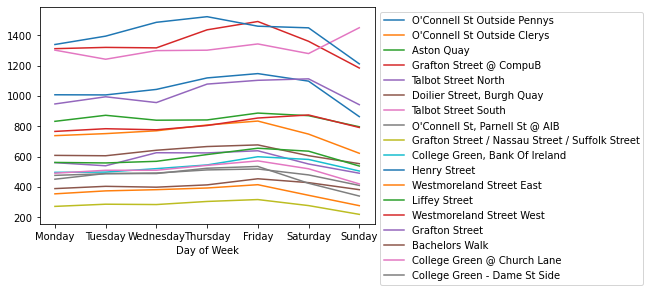

In [48]:
pedDay[["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",
       'Aston Quay', 'Grafton Street @ CompuB', 'Talbot Street North',
       'Doilier Street, Burgh Quay', 'Talbot Street South', "O'Connell St, Parnell St @ AIB",
       'Grafton Street / Nassau Street / Suffolk Street',
       'College Green, Bank Of Ireland', 'Henry Street',
       'Westmoreland Street East', 'Liffey Street', 'Westmoreland Street West',
       'Grafton Street', 'Bachelors Walk', 'College Green @ Church Lane',
       'College Green - Dame St Side']].plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

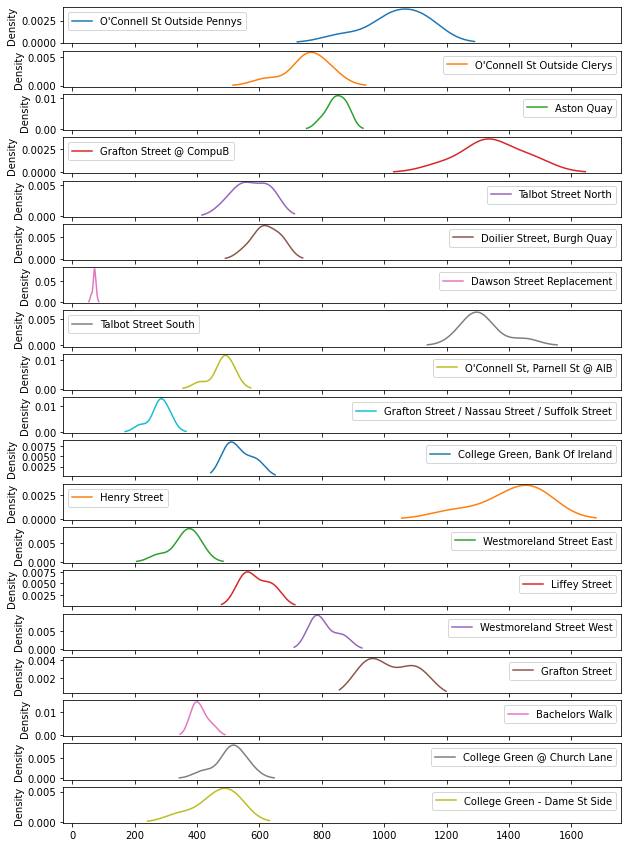

In [49]:
pedDay[pedCols].plot(kind='density', subplots=True, figsize=(10,15));

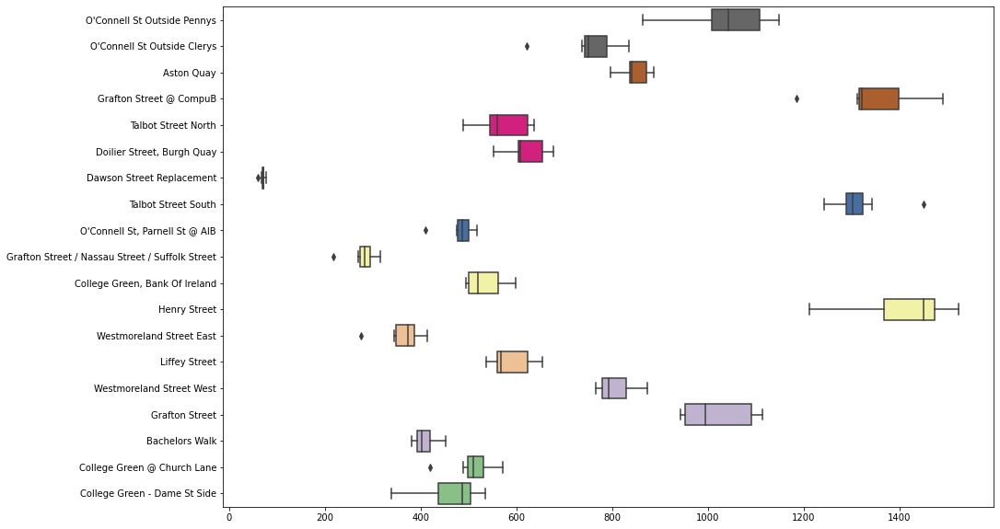

In [50]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=pedDay, orient='h', palette='Accent_r');

### Pedestrian Hour

In [51]:
pedHour = pedCountEDA.groupby(by='hour').mean()
pedHour.drop(columns=['Day'], inplace=True)
pedHour

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side
hour,,,,,,,,,,,,,,,,,,,
0,221.22,199.60,525.69,460.23,378.59,475.85,37.08,1738.78,99.73,73.26,267.71,167.42,153.46,207.92,401.19,325.42,159.04,131.28,105.45
1,151.04,111.82,382.57,308.92,232.68,358.00,25.53,1926.10,58.13,48.09,207.54,106.64,89.87,137.63,290.32,262.67,115.49,79.55,60.95
2,132.77,100.56,338.62,241.28,161.77,284.30,21.50,1802.84,45.33,38.84,174.33,83.74,66.10,109.88,256.35,245.84,81.01,58.94,47.50
3,121.22,77.21,258.44,218.19,114.59,196.21,18.29,1496.66,36.85,32.86,167.58,64.61,55.32,85.22,231.32,237.37,60.55,50.20,33.95
4,71.41,40.21,167.59,142.10,90.27,106.73,16.32,1314.50,25.99,15.48,116.93,59.55,31.32,30.71,96.10,130.16,36.91,21.83,17.12
5,74.82,67.60,157.43,159.81,93.40,109.30,21.17,1205.94,37.87,19.02,102.99,98.74,33.68,27.03,88.84,79.27,37.82,30.82,34.02
6,221.31,291.74,443.04,565.79,203.15,365.76,52.83,1388.92,109.23,74.65,216.70,280.99,102.34,94.06,304.93,188.08,155.70,215.30,146.50
7,402.88,514.95,887.29,1170.24,419.53,597.83,61.88,1799.67,194.64,153.41,303.28,520.80,202.22,205.40,514.86,409.15,342.63,311.19,349.81
8,828.64,848.74,964.81,1578.78,649.93,750.02,76.32,1901.73,391.42,321.05,486.84,983.54,401.24,422.14,811.79,909.27,594.47,594.89,774.43


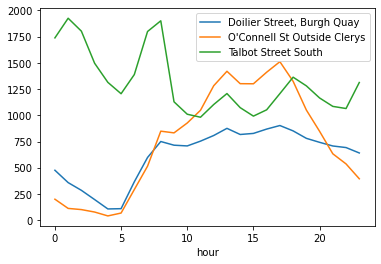

In [52]:
pedHour[['Doilier Street, Burgh Quay',"O'Connell St Outside Clerys",'Talbot Street South']].plot();

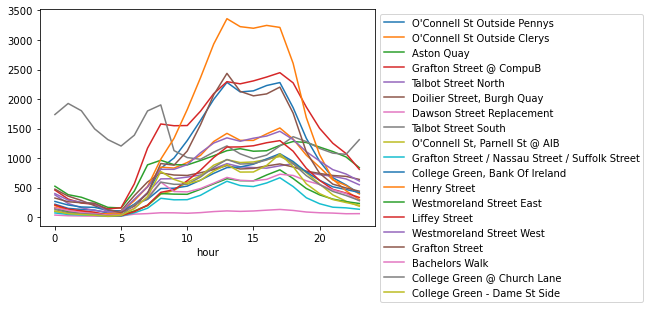

In [53]:
pedHour.plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

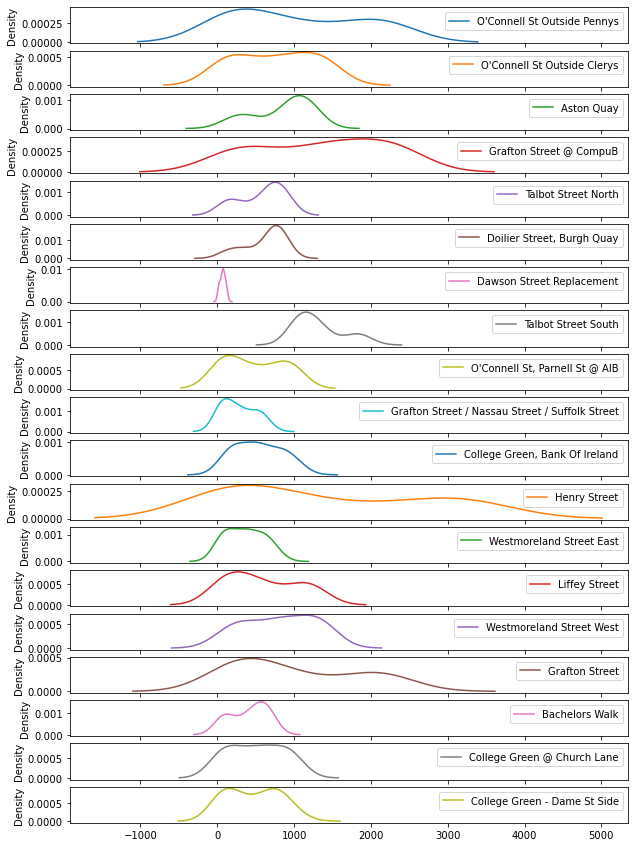

In [54]:
pedHour[pedCols].plot(kind='density', subplots=True, figsize=(10,15));

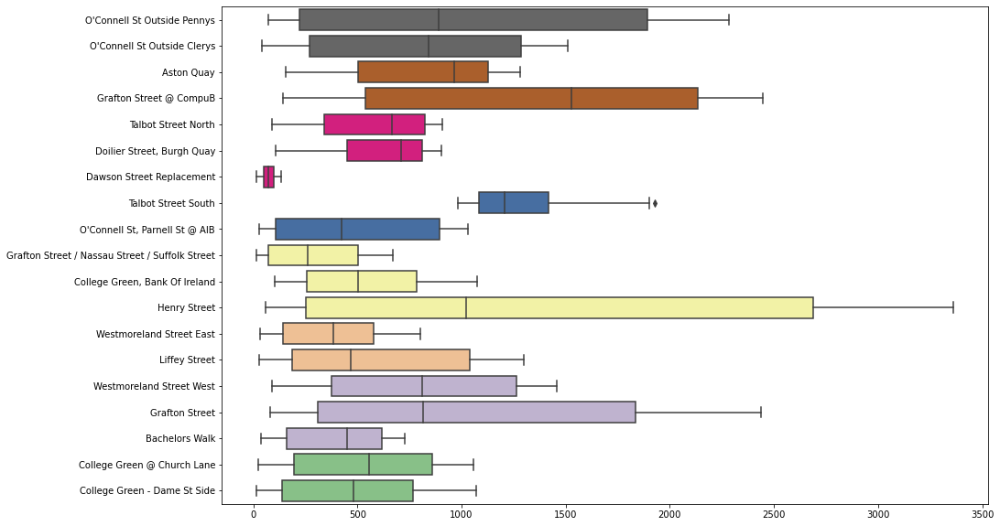

In [55]:
#sns.boxenplot(data=pedHour)
plt.figure(figsize=[15, 10])
sns.boxplot(data=pedHour, orient='h', palette='Accent_r');

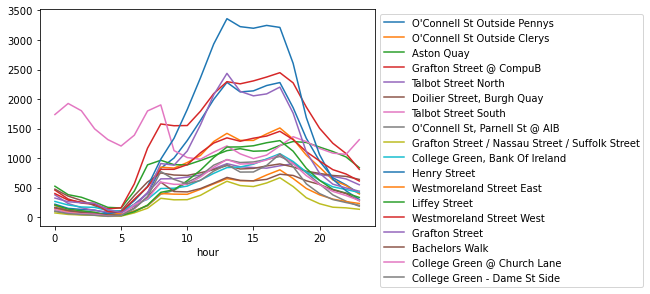

In [56]:
pedHour[["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",
       'Aston Quay', 'Grafton Street @ CompuB', 'Talbot Street North',
       'Doilier Street, Burgh Quay', 'Talbot Street South', "O'Connell St, Parnell St @ AIB",
       'Grafton Street / Nassau Street / Suffolk Street',
       'College Green, Bank Of Ireland', 'Henry Street',
       'Westmoreland Street East', 'Liffey Street', 'Westmoreland Street West',
       'Grafton Street', 'Bachelors Walk', 'College Green @ Church Lane',
       'College Green - Dame St Side']].plot()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

## Cycle

In [57]:
cycleCount

,date,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
0,2019-01-01 00:00:00,12.00,4.00,16.00,1.00,5.00
1,2019-01-01 01:00:00,17.00,8.00,14.00,1.00,6.00
2,2019-01-01 02:00:00,18.00,9.00,9.00,2.00,2.00
3,2019-01-01 03:00:00,18.00,5.00,15.00,1.00,3.00
4,2019-01-01 04:00:00,12.00,3.00,8.00,1.00,5.00
...,...,...,...,...,...,...
17538,2020-12-31 19:00:00,55.00,9.00,5.00,2.00,26.00
17539,2020-12-31 20:00:00,34.00,2.00,11.00,0.00,13.00
17540,2020-12-31 21:00:00,22.00,2.00,11.00,3.00,4.00
17541,2020-12-31 22:00:00,24.00,7.00,9.00,3.00,15.00


In [58]:
cycleCount.describe()

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
count,17526.00,17528.00,17528.00,17528.00,17527.00
mean,115.98,42.48,49.56,6.01,47.03
std,147.59,67.60,70.97,7.18,55.42
min,0.00,0.00,0.00,0.00,0.00
25%,25.00,6.00,11.00,1.00,10.00
50%,79.00,25.00,29.00,4.00,32.00
75%,134.00,50.00,57.00,8.00,58.00
max,1152.00,595.00,615.00,61.00,420.00


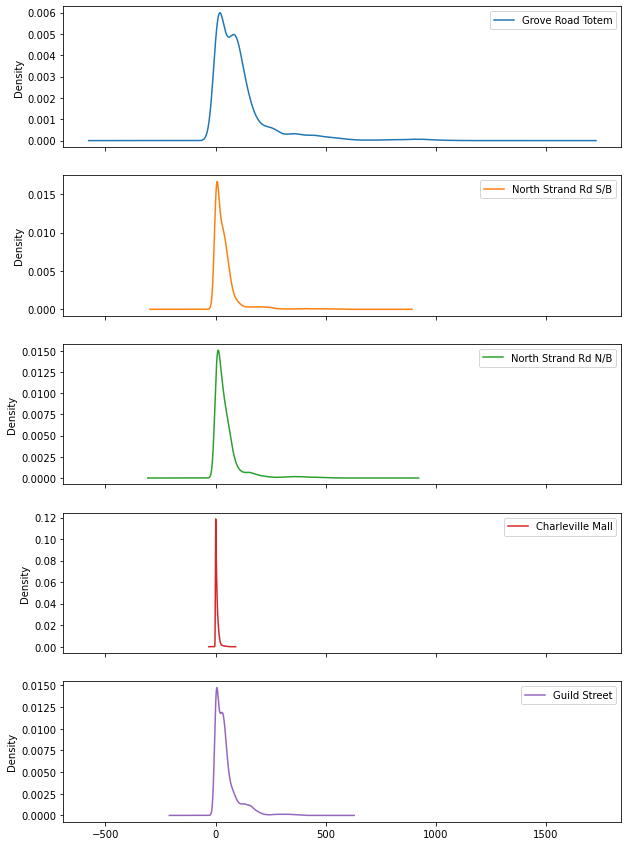

In [59]:
cycleCount[cycleCols].plot(kind='density', subplots=True, figsize=(10,15));

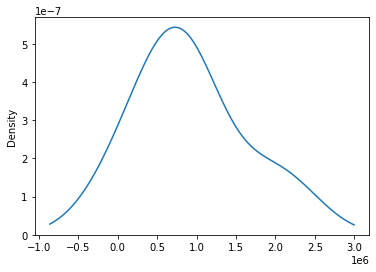

In [60]:
cycleCount.sum().plot(kind='density');

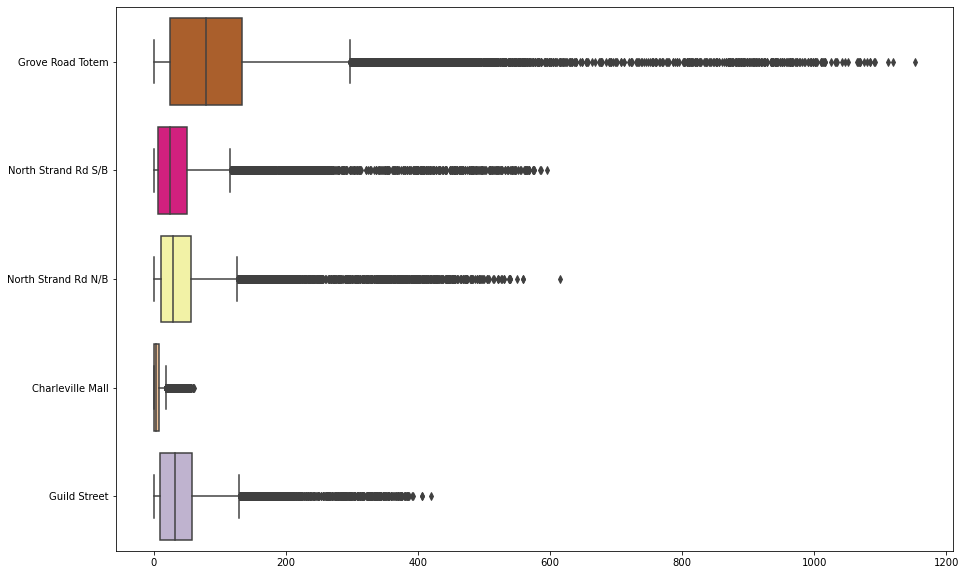

In [61]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=cycleCount, orient='h', palette='Accent_r');

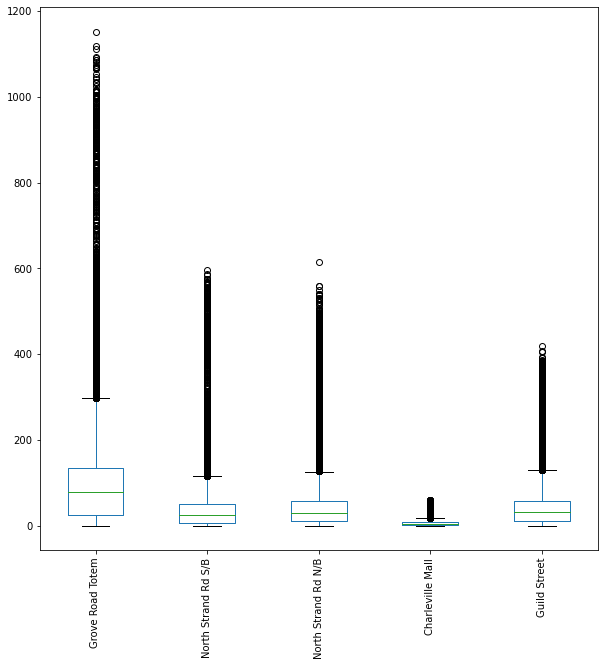

In [62]:
cycleCount.plot.box(figsize=(10,10))
plt.xticks(rotation=90);

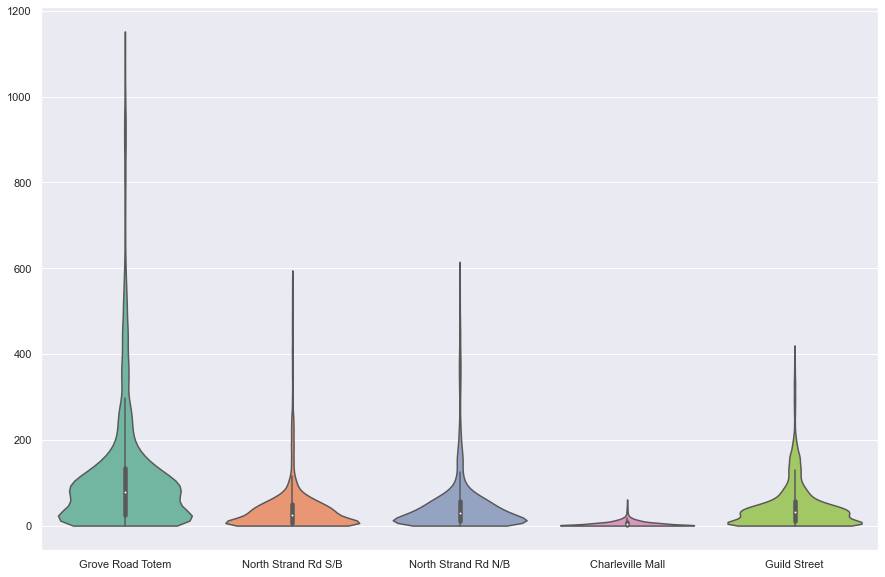

In [63]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=cycleCount, scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

### Cycle Day

In [64]:
cycleCountEDA = cycleCount.copy()
cycleCountEDA['hour'] = cycleCountEDA.date.dt.hour
cycleCountEDA['Day of Week'] = cycleCountEDA.date.dt.day_name()
cycleCountEDA['Day'] = cycleCountEDA.date.dt.dayofweek
cycleCountEDA.set_index('date', inplace=True)
cycleCountEDA.sort_values('Day',inplace=True)
cycleCountEDA

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,hour,Day of Week,Day
date,,,,,,,,
2020-05-18 18:00:00,165.00,58.00,91.00,2.00,42.00,18,Monday,0
2019-04-01 11:00:00,56.00,35.00,25.00,4.00,28.00,11,Monday,0
2019-04-01 12:00:00,80.00,30.00,31.00,7.00,36.00,12,Monday,0
2019-04-01 13:00:00,71.00,24.00,44.00,4.00,31.00,13,Monday,0
2019-04-01 14:00:00,90.00,33.00,65.00,5.00,35.00,14,Monday,0
...,...,...,...,...,...,...,...,...
2019-11-17 17:00:00,99.00,32.00,37.00,2.00,36.00,17,Sunday,6
2019-11-17 16:00:00,91.00,27.00,43.00,5.00,37.00,16,Sunday,6
2019-11-17 15:00:00,87.00,37.00,40.00,4.00,47.00,15,Sunday,6


In [65]:
cycleDay = cycleCountEDA.groupby(by='Day of Week').mean()
cycleDay.sort_values('Day', inplace=True)
cycleDay.drop(columns=['hour','Day'], inplace=True)
cycleDay

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
Day of Week,,,,,
Monday,125.91,46.28,53.83,6.27,50.45
Tuesday,132.86,47.95,56.23,6.47,52.98
Wednesday,130.80,47.55,54.82,6.45,52.55
Thursday,138.62,49.68,57.13,6.77,55.05
Friday,117.52,43.44,49.88,6.12,48.04
Saturday,86.17,32.59,38.93,5.11,35.97
Sunday,79.55,29.68,35.90,4.90,34.01


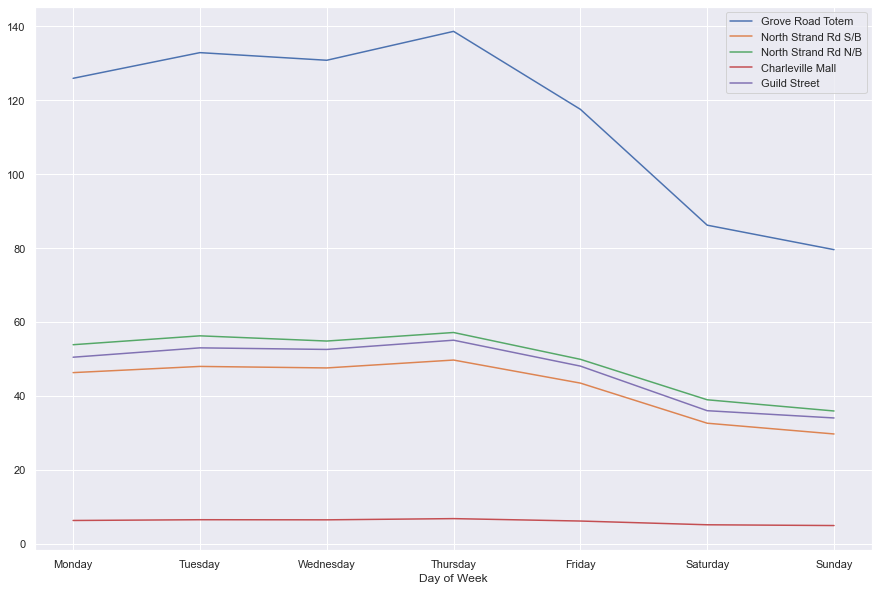

In [66]:
cycleDay.plot.line();

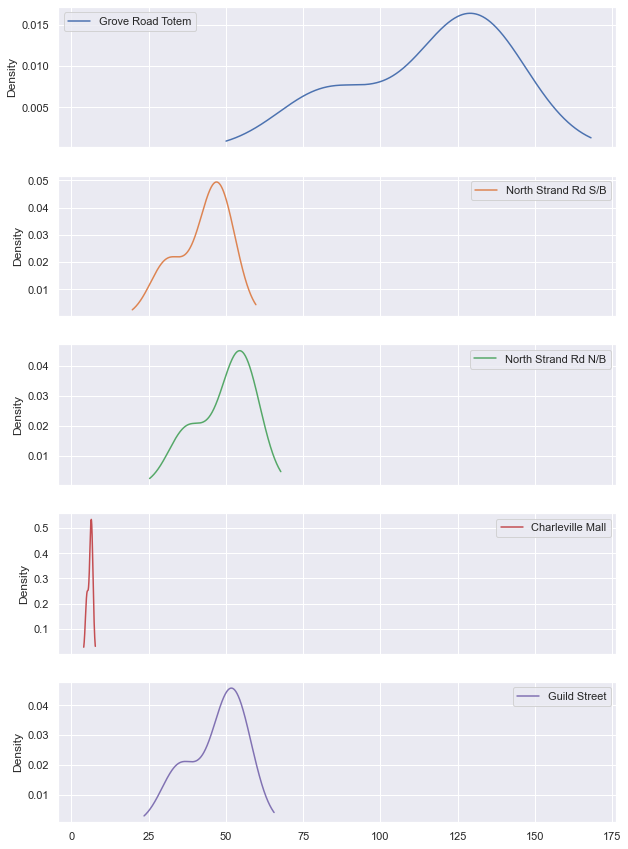

In [67]:
cycleDay[cycleCols].plot(kind='density', subplots=True, figsize=(10,15));

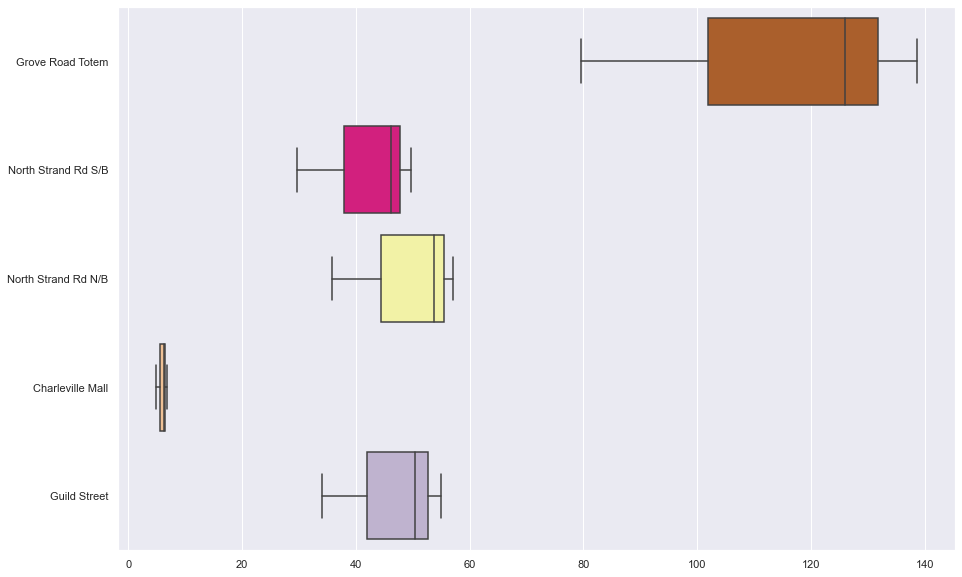

In [68]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=cycleDay, orient='h', palette='Accent_r');

### Cycle Hour

In [69]:
cycleHour = cycleCountEDA.groupby(by='hour').mean()
cycleHour.drop(columns=['Day'], inplace=True)
cycleHour

,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street
hour,,,,,
0,18.71,4.03,14.92,1.23,6.25
1,9.12,2.03,7.99,0.71,2.46
2,6.43,1.54,5.32,0.60,1.35
3,5.77,1.43,4.71,0.68,1.77
4,9.55,4.83,3.58,0.73,2.81
5,23.66,15.07,4.58,0.98,13.27
6,86.43,56.93,12.22,3.96,72.86
7,218.47,112.64,28.22,8.06,100.74
8,427.69,220.41,38.26,20.69,158.53


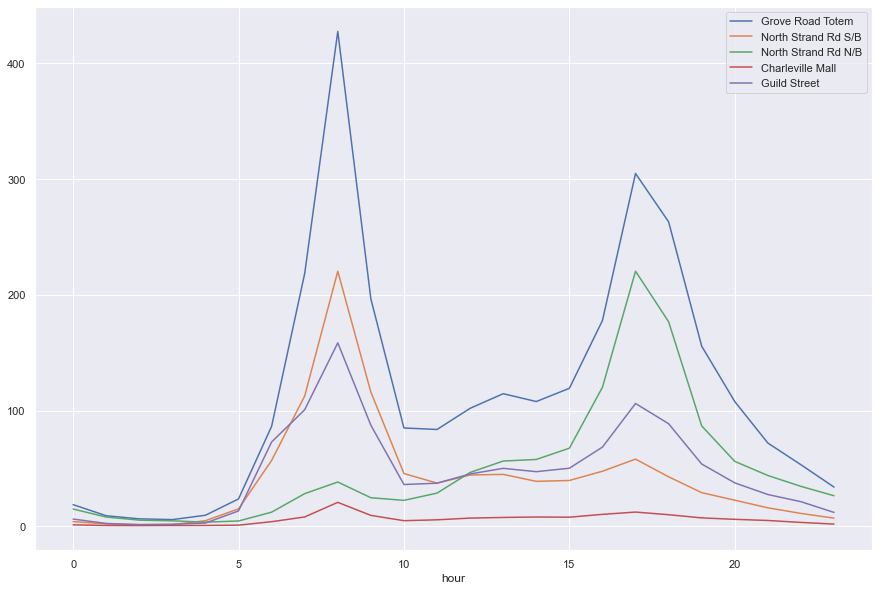

In [70]:
cycleHour.plot.line();

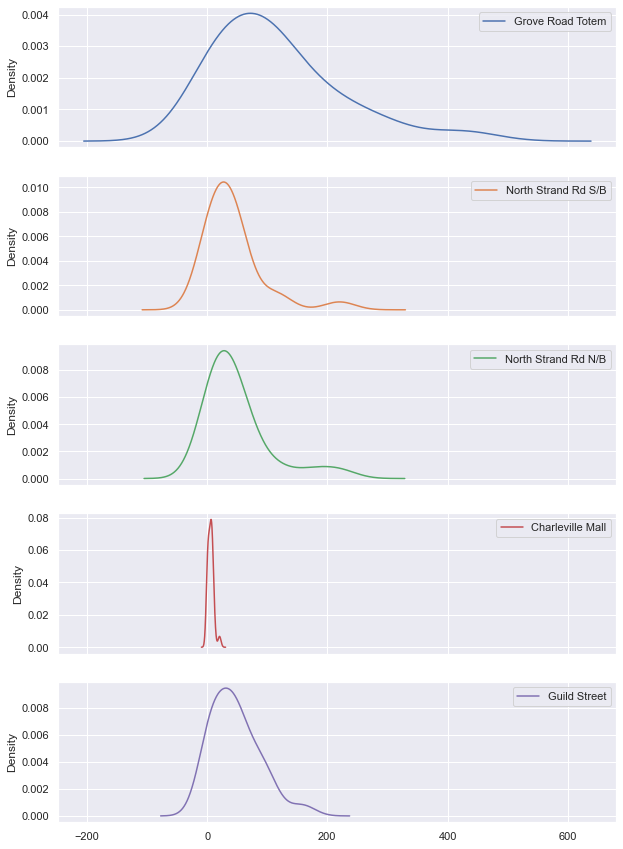

In [71]:
cycleHour[cycleCols].plot(kind='density', subplots=True, figsize=(10,15));

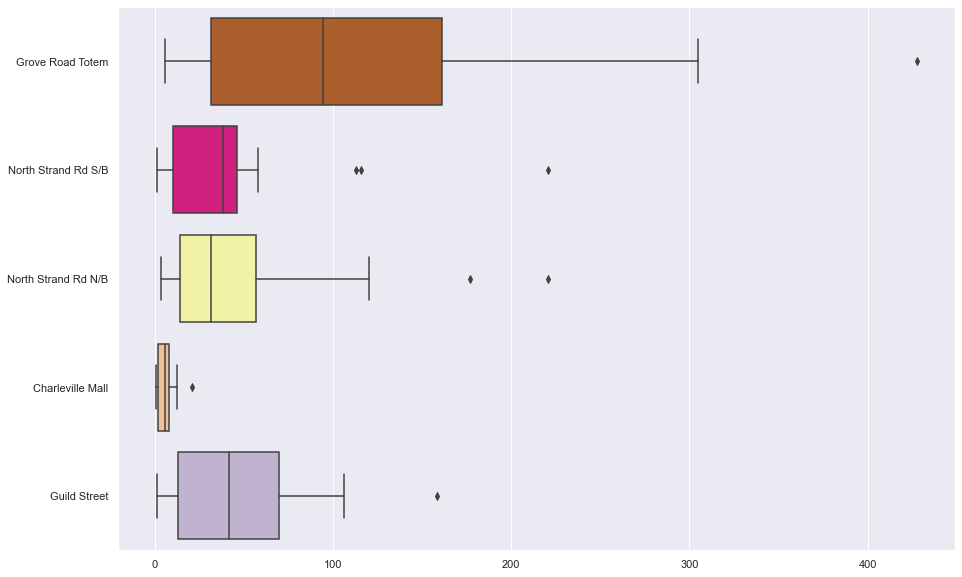

In [72]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=cycleHour, orient='h', palette='Accent_r');

## Correlations

### Weather

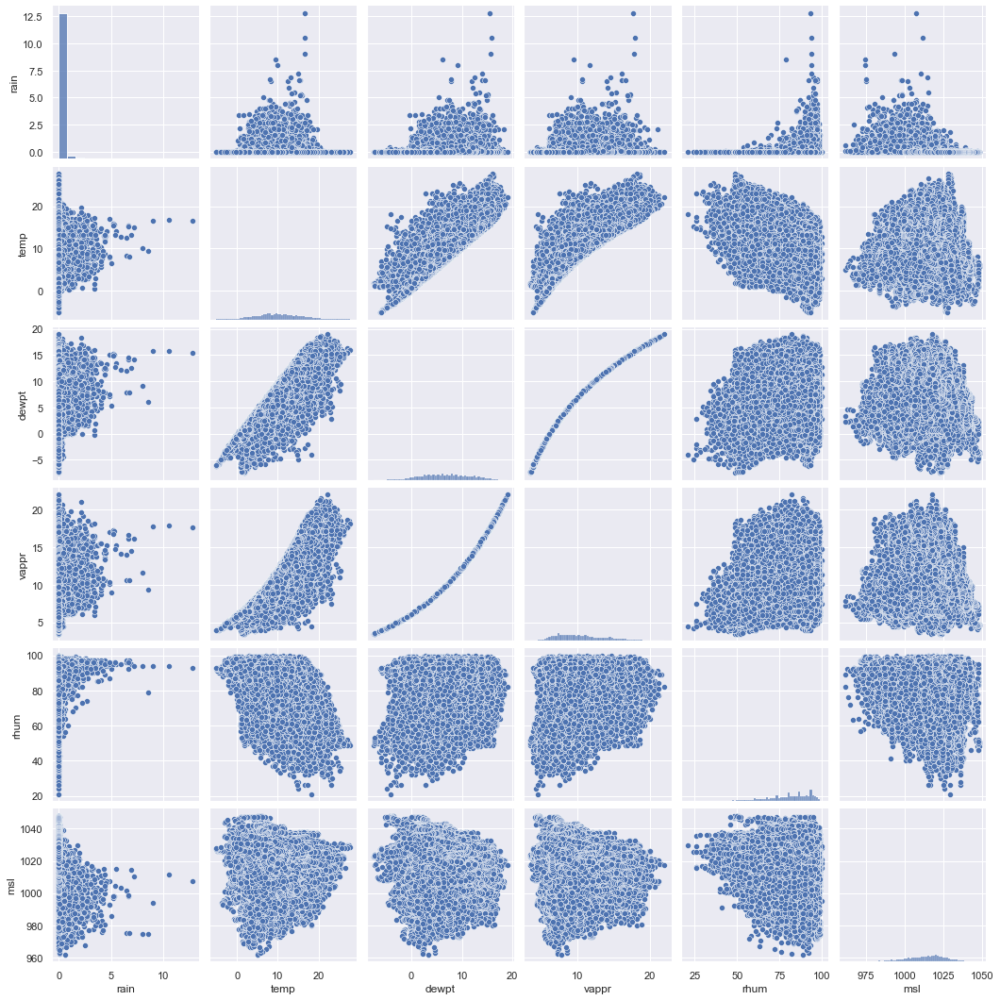

In [73]:
sns.pairplot(data=hourlyWeather);

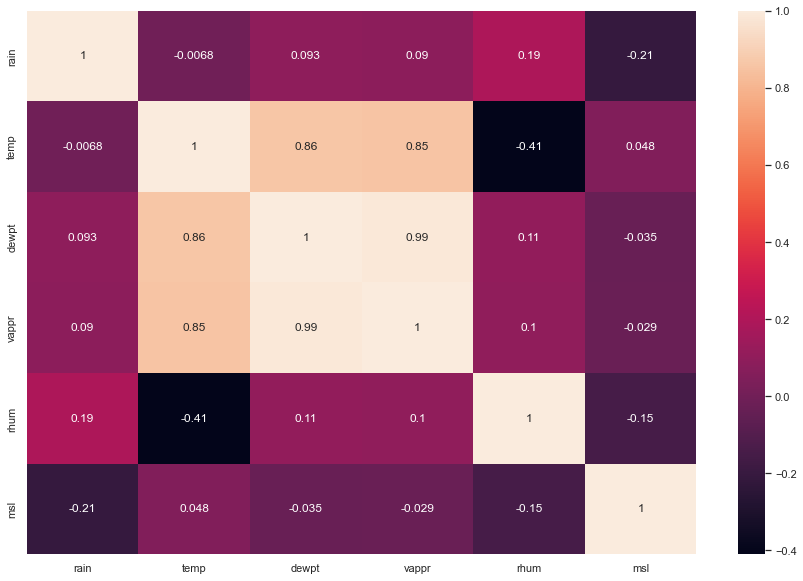

In [74]:
sns.heatmap(hourlyWeather.corr(), annot=True);

### Pedestrian

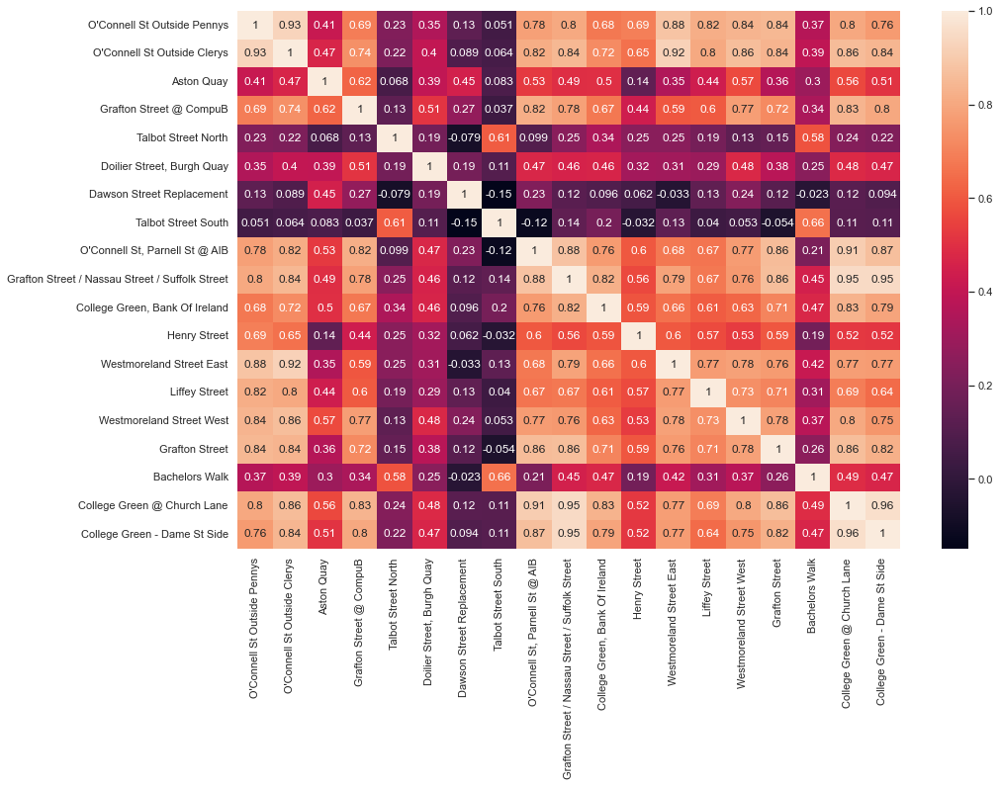

In [75]:
sns.heatmap(pedCount.corr(), annot=True);

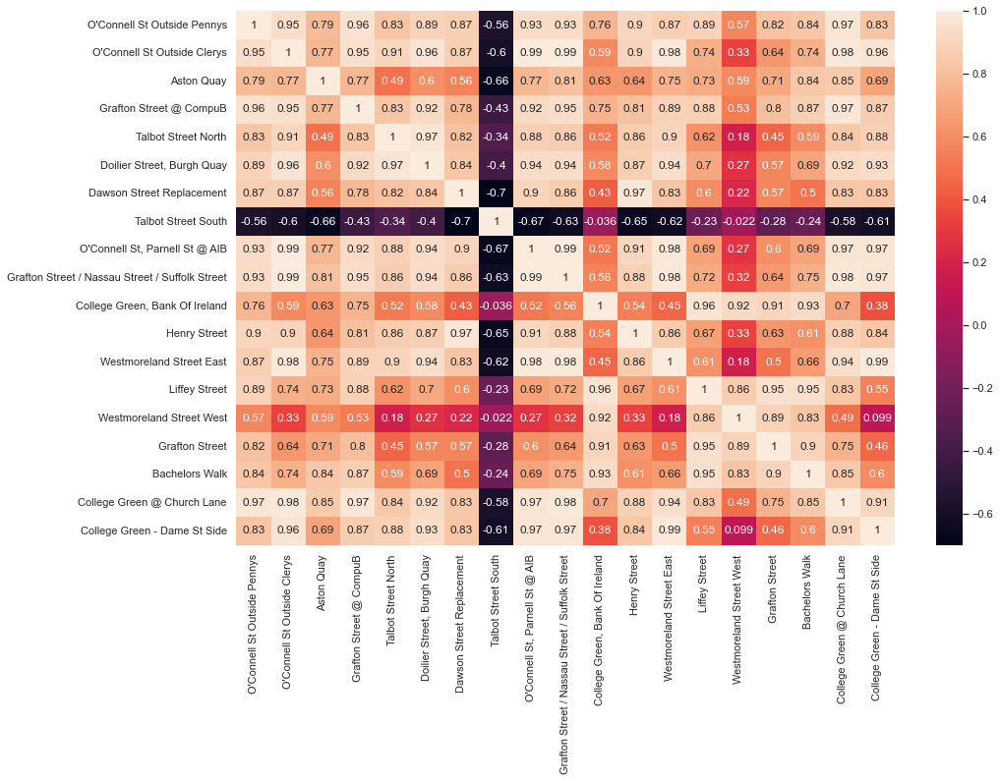

In [76]:
sns.heatmap(pedDay.corr(), annot=True);

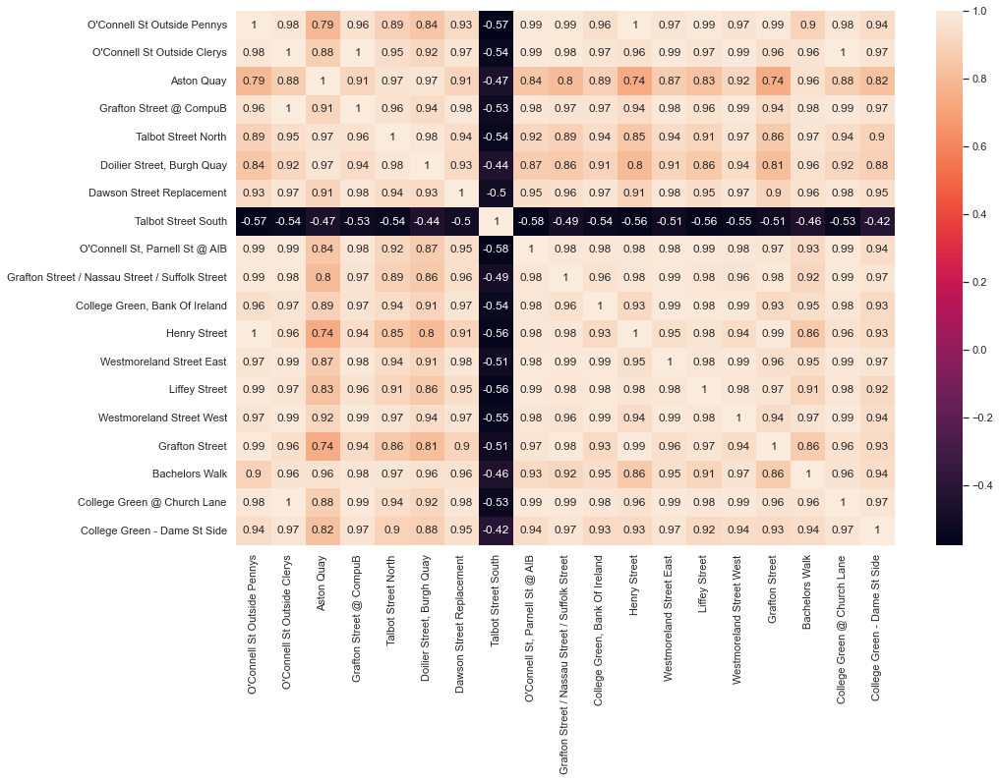

In [77]:
sns.heatmap(pedHour.corr(), annot=True);

### Cycle

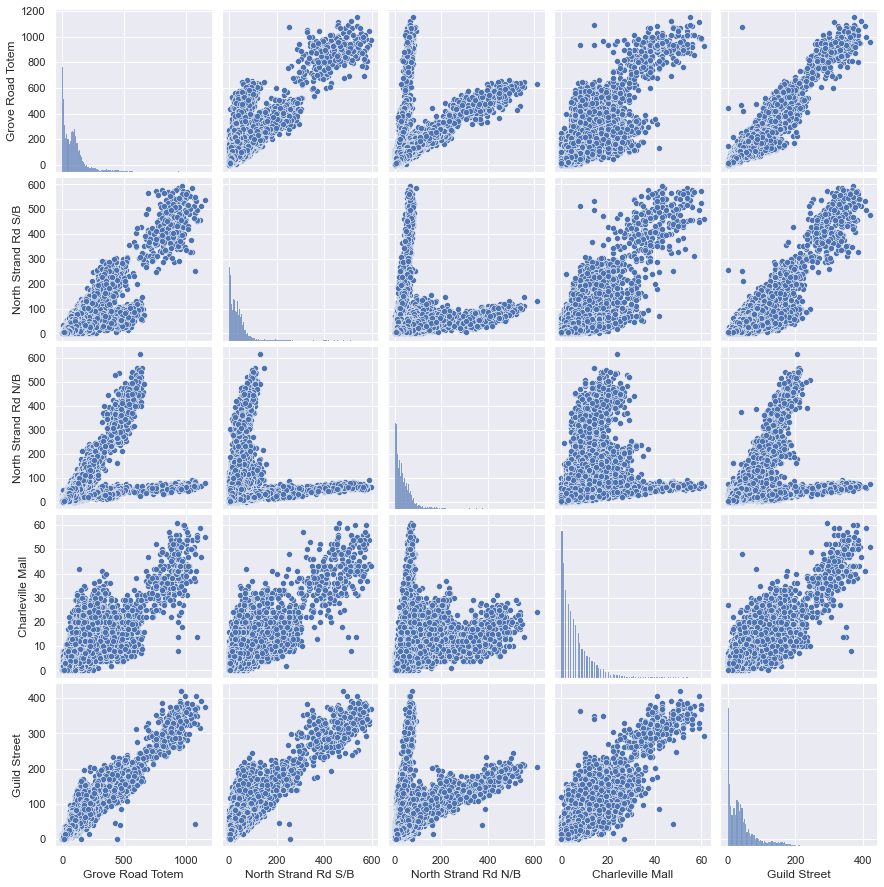

In [78]:
sns.pairplot(data=cycleCount);

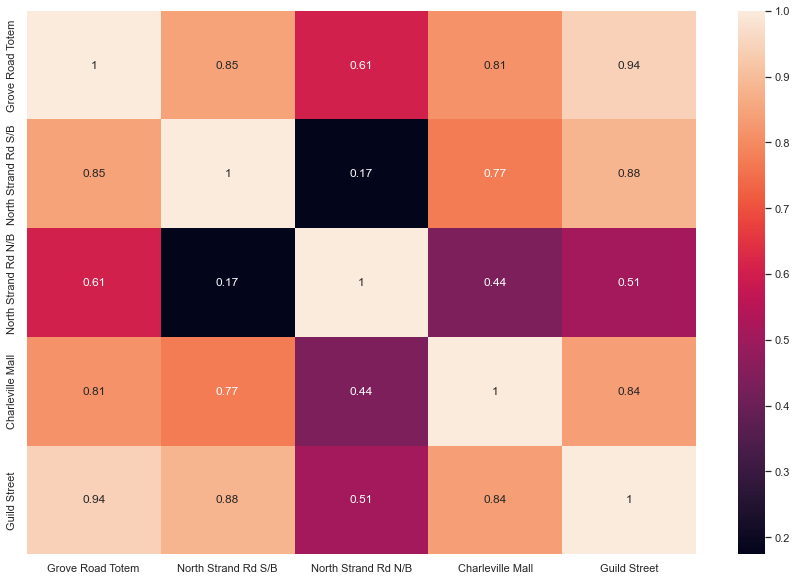

In [79]:
sns.heatmap(cycleCount.corr(), annot=True);

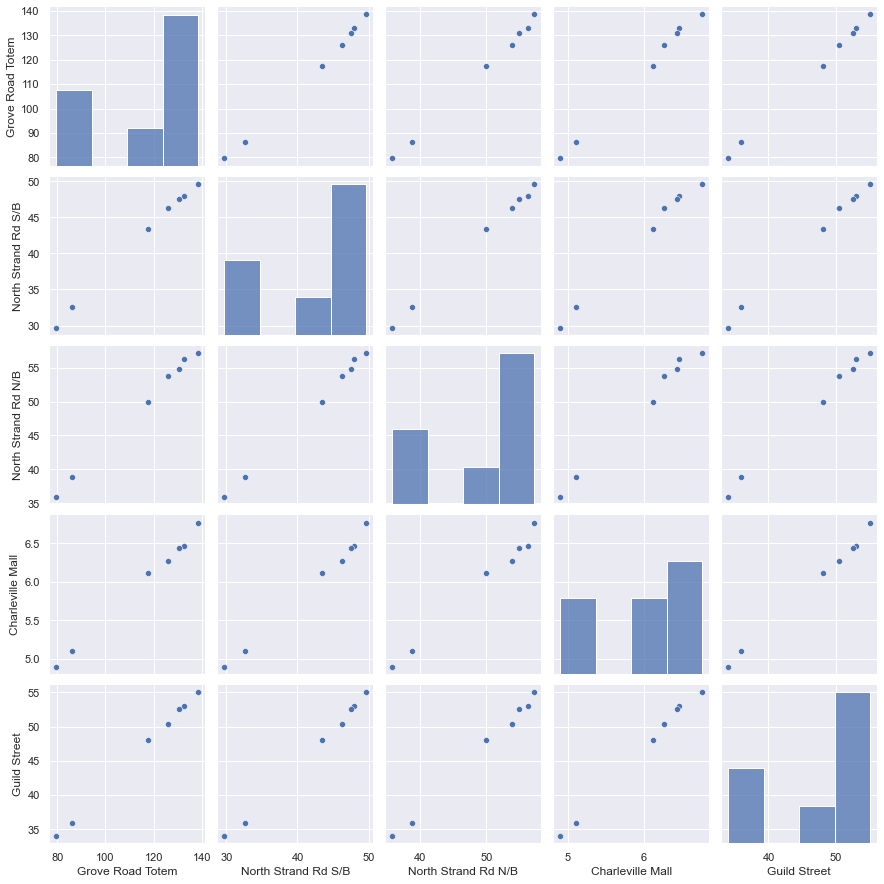

In [80]:
sns.pairplot(data=cycleDay);

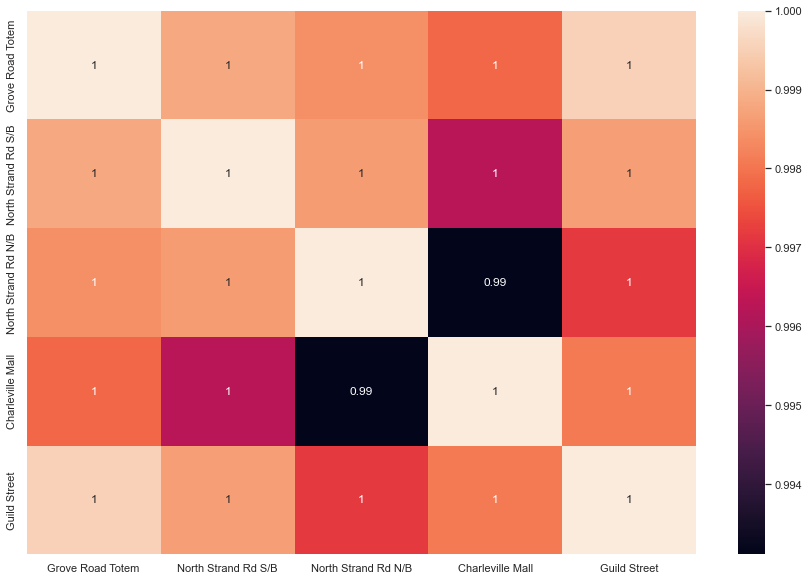

In [81]:
sns.heatmap(cycleDay.corr(), annot=True);

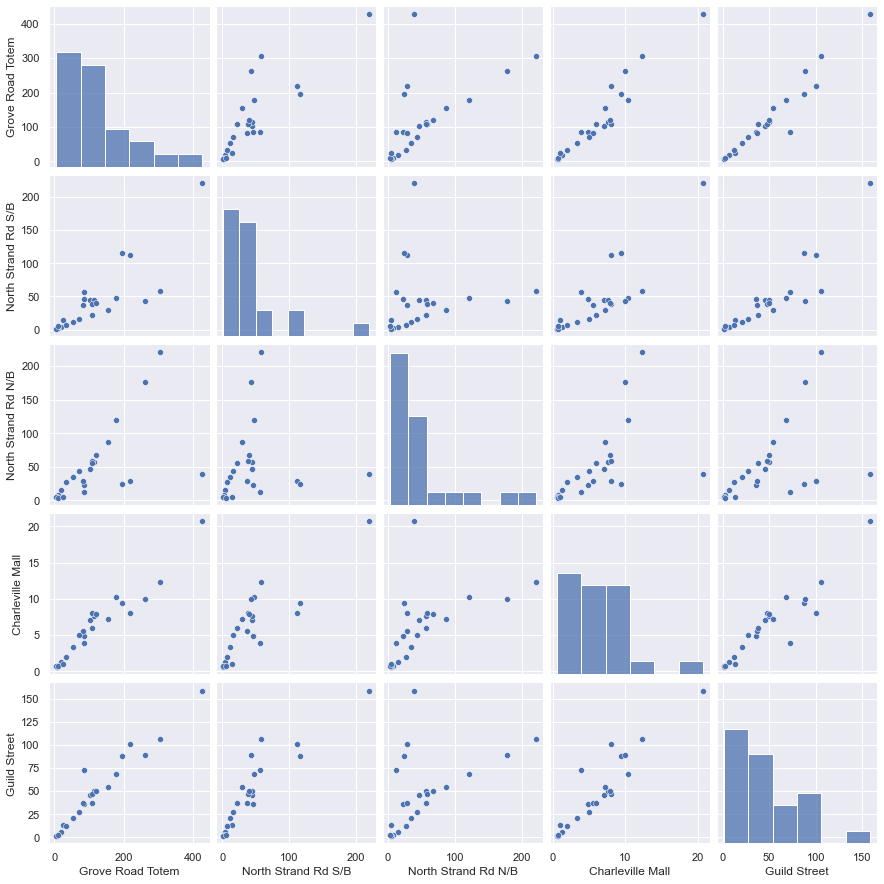

In [82]:
sns.pairplot(data=cycleHour);

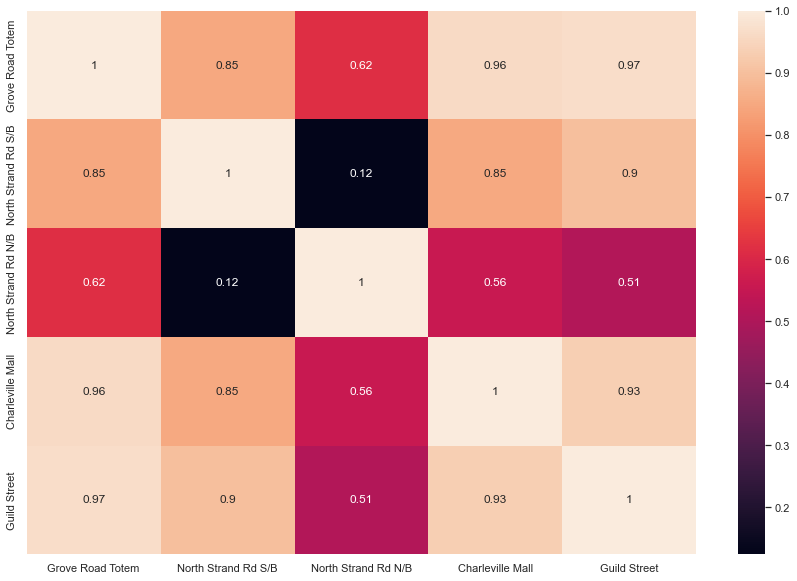

In [83]:
sns.heatmap(cycleHour.corr(), annot=True);

# Merge Datasets

In [84]:
# Training and testing dataset
df = pd.merge_asof(pedCount, cycleCount, on='date')
df = pd.merge_asof(df, hourlyWeather, on='date')
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
0,2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10
1,2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10
2,2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90
3,2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50
4,2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80
17540,2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60
17541,2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10
17542,2020-12-31 22:00:00,149.00,142.00,162.00,179.00,478.00,886.00,120.00,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80


In [85]:
# Validation Dataset
df2021 = pd.merge_asof(pedCount2021, cycleCount2021, on='date')
df2021 = pd.merge_asof(df2021, hourlyWeather, on='date')
df2021

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
0,2021-01-01 00:00:00,137.00,125.00,165.00,111.00,525.00,793.00,45.00,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90
1,2021-01-01 01:00:00,53.00,51.00,25.00,42.00,1204.00,448.00,10.00,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40
2,2021-01-01 02:00:00,49.00,38.00,27.00,25.00,1837.00,262.00,8.00,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80
3,2021-01-01 03:00:00,30.00,12.00,16.00,15.00,2996.00,88.00,6.00,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30
4,2021-01-01 04:00:00,24.00,12.00,16.00,17.00,3621.00,40.00,11.00,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2021-12-31 19:00:00,NaN,807.00,NaN,832.00,0.00,736.00,145.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40
8756,2021-12-31 20:00:00,NaN,884.00,NaN,740.00,0.00,784.00,184.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00
8757,2021-12-31 21:00:00,NaN,513.00,NaN,413.00,0.00,499.00,75.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40
8758,2021-12-31 22:00:00,NaN,385.00,NaN,344.00,0.00,357.00,43.00,1522.00,181.00,53.00,841.00,1401.00,86.00,NaN,543.00,1428.00,690.00,225.00,106.00,19.00,2.00,11.00,3.00,0.00,0.00,14.40,11.40,13.50,82.00,1009.80


## Daily Data

In [86]:
dfDaily = df.resample('D', on='date').sum()
dfDaily

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01,25635.00,18094.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,20171.00,11862.00,11750.00,18673.00,7293.00,0.00,0.00,0.00,667.00,234.00,377.00,43.00,244.00,0.40,192.00,138.90,222.60,2054.00,24917.60
2019-01-02,39228.00,23029.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,44388.00,13184.00,16710.00,19113.00,12504.00,0.00,0.00,0.00,3249.00,1109.00,1319.00,107.00,1181.00,0.00,138.70,58.10,175.00,1896.00,25034.90
2019-01-03,37113.00,23952.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,44369.00,13844.00,19337.00,19777.00,12080.00,0.00,0.00,0.00,3994.00,1349.00,1572.00,177.00,1353.00,0.00,163.00,77.40,184.80,1862.00,25001.50
2019-01-04,38521.00,24395.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,41426.00,14517.00,18217.00,21408.00,12186.00,0.00,0.00,0.00,4406.00,1628.00,1940.00,193.00,1558.00,0.00,140.00,26.30,159.10,1709.00,25004.40
2019-01-05,36136.00,19959.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,38346.00,11205.00,18616.00,20757.00,10379.00,0.00,0.00,0.00,4850.00,1693.00,1961.00,197.00,1621.00,0.00,159.20,64.60,178.20,1815.00,24913.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,9023.00,5540.00,3055.00,11631.00,7510.00,13455.00,1682.00,33203.00,5387.00,1447.00,8082.00,34336.00,1462.00,7808.00,9843.00,10658.00,1302.00,3416.00,2460.00,780.00,298.00,391.00,68.00,398.00,5.10,72.50,26.90,159.80,2084.00,23338.80
2020-12-28,10825.00,6160.00,6842.00,11101.00,7047.00,10499.00,1813.00,20875.00,5768.00,1620.00,7853.00,40282.00,1580.00,6420.00,8696.00,10826.00,1881.00,3506.00,2575.00,727.00,242.00,347.00,65.00,331.00,1.20,100.40,50.30,170.60,2063.00,23463.00
2020-12-29,14654.00,8673.00,8267.00,16035.00,10631.00,14317.00,2920.00,23385.00,7181.00,2515.00,10941.00,42930.00,2385.00,7845.00,12823.00,14929.00,1613.00,5044.00,3983.00,1225.00,428.00,618.00,108.00,609.00,0.30,78.70,27.10,159.50,2054.00,23909.70


## Daily Line Plots

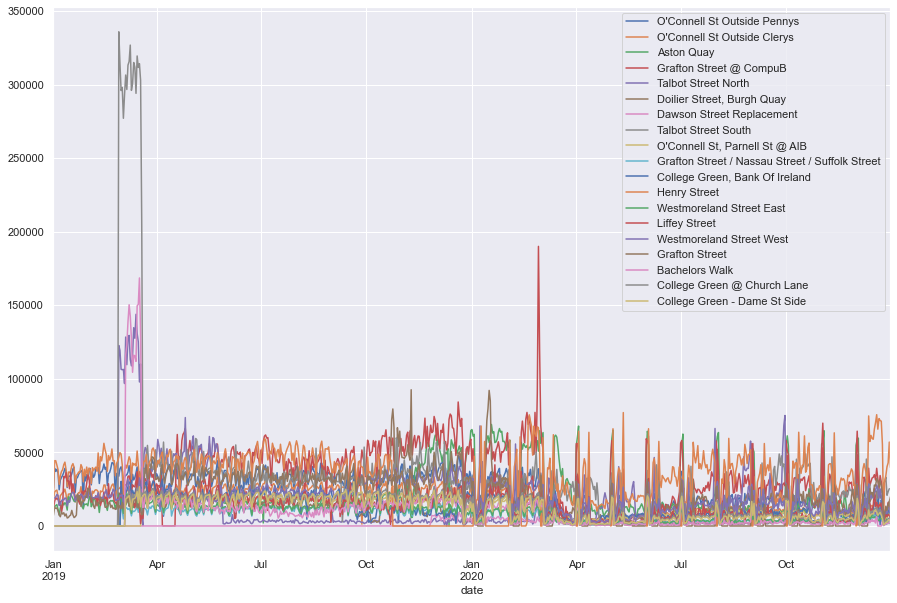

In [87]:
dfDaily[pedCols].plot.line()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

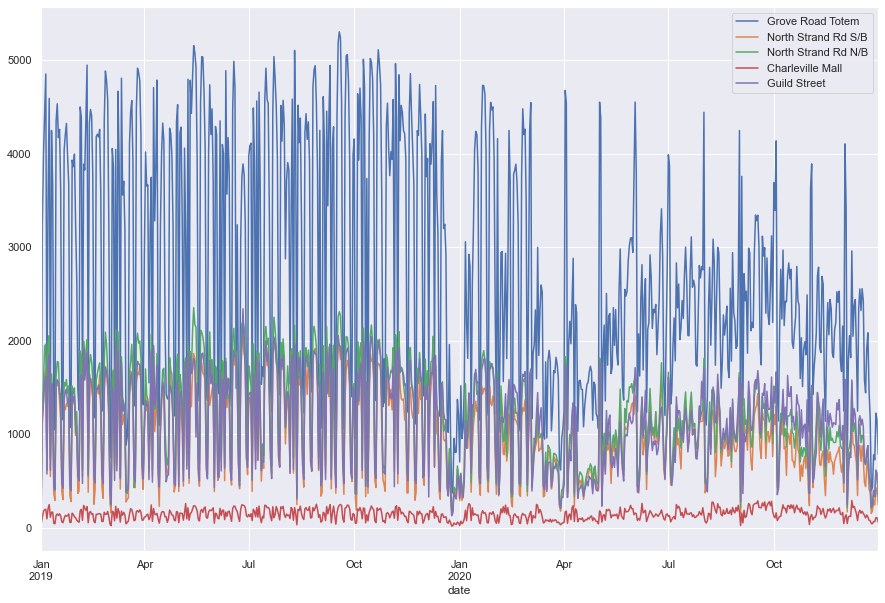

In [88]:
dfDaily[cycleCols].plot.line()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

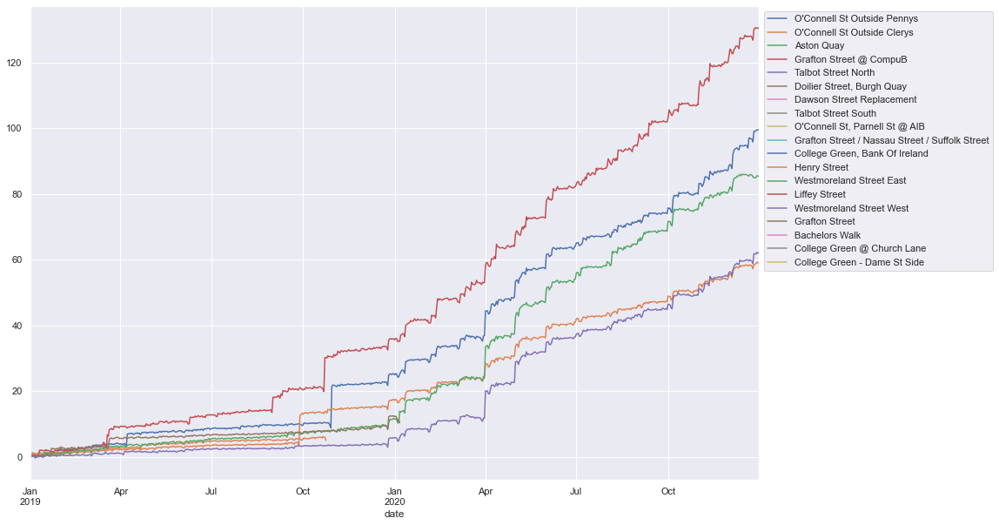

In [89]:
dfDaily[pedCols].pct_change().cumsum().plot.line()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

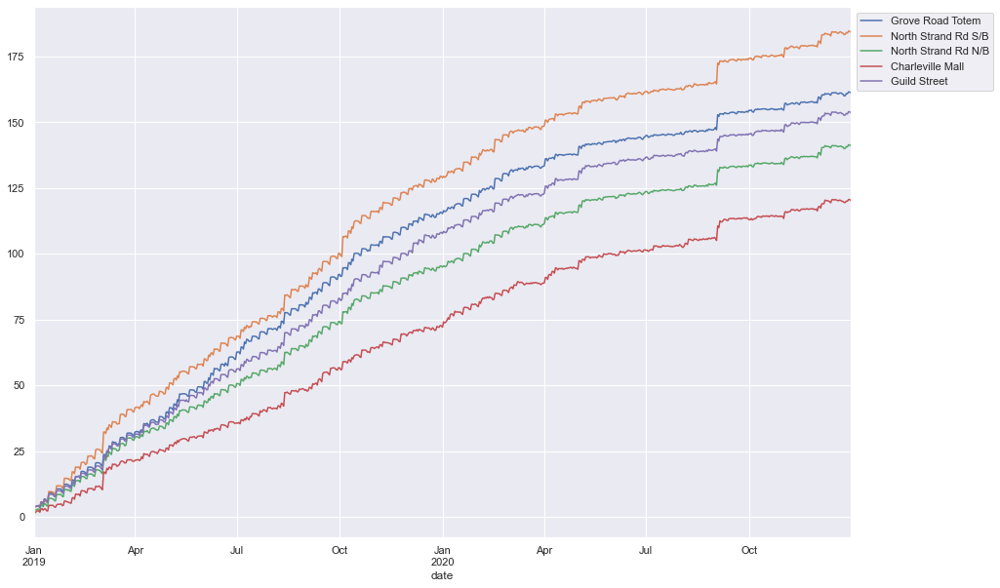

In [90]:
dfDaily[cycleCols].pct_change().cumsum().plot.line()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

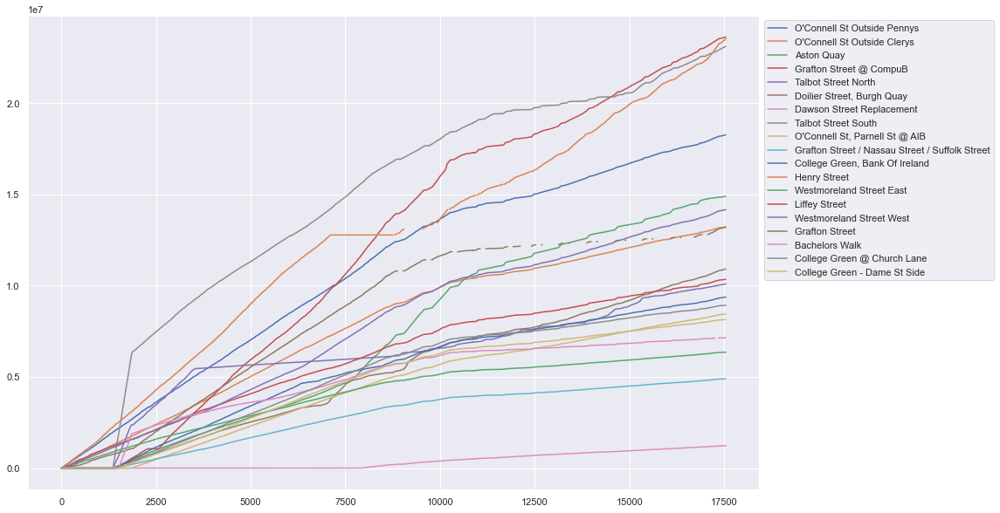

In [91]:
df[pedCols].cumsum().plot.line()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

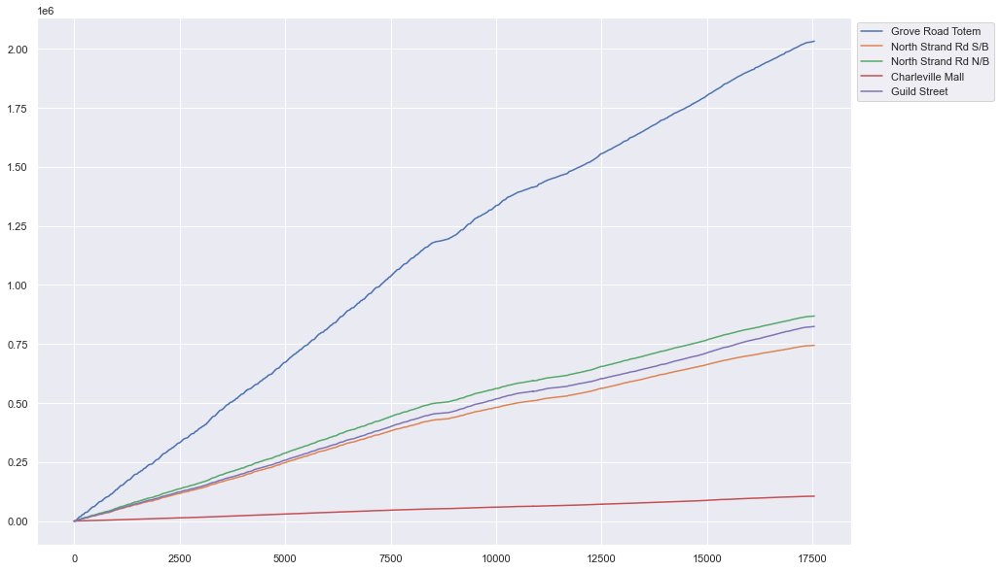

In [92]:
df[cycleCols].cumsum().plot.line()
plt.legend(bbox_to_anchor=(1.0, 1.0))
plt.show();

# Feature Engineering

## Add Day of Week and Hour of Day

In [93]:
df['Day of Week'] = df.date.dt.dayofweek
df2021['Day of Week'] = df2021.date.dt.dayofweek
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week
0,2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1
1,2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1
2,2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1
3,2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1
4,2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3
17540,2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3
17541,2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3
17542,2020-12-31 22:00:00,149.00,142.00,162.00,179.00,478.00,886.00,120.00,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3


In [94]:
df['Hour'] = df.date.dt.hour
df2021['Hour'] = df2021.date.dt.hour
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour
0,2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0
1,2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1
2,2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2
3,2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3
4,2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19
17540,2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20
17541,2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21
17542,2020-12-31 22:00:00,149.00,142.00,162.00,179.00,478.00,886.00,120.00,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3,22


## Add Months

In [95]:
df['Month'] = df.date.dt.month
df2021['Month'] = df2021.date.dt.month
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Month
0,2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1
1,2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1
2,2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1
3,2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1
4,2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,12
17540,2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,12
17541,2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,12
17542,2020-12-31 22:00:00,149.00,142.00,162.00,179.00,478.00,886.00,120.00,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3,22,12


## Add Seasons

In [96]:
df['Season'] = (df.date.dt.month%12 // 3  + 1)
df2021['Season'] = (df2021.date.dt.month%12 // 3  + 1)
df

,date,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Month,Season
0,2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1,1
1,2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1,1
2,2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1,1
3,2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1,1
4,2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17539,2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,12,1
17540,2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,12,1
17541,2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,12,1
17542,2020-12-31 22:00:00,149.00,142.00,162.00,179.00,478.00,886.00,120.00,1024.00,92.00,10.00,139.00,213.00,35.00,66.00,168.00,82.00,44.00,62.00,35.00,24.00,7.00,9.00,3.00,15.00,0.00,4.40,2.90,7.50,89.00,1011.80,3,22,12,1


## Total Counts

In [97]:
df['Cycle Total'] = df[['North Strand Rd S/B','North Strand Rd N/B', 'Charleville Mall',
        'Guild Street']].sum(axis=1)
df['Pedestrian Total'] = df[["O'Connell St Outside Pennys",
       "O'Connell St Outside Clerys",'Talbot Street North', 
        'Talbot Street South',"O'Connell St, Parnell St @ AIB", 
        'Henry Street', 'Liffey Street','Bachelors Walk']].sum(axis=1)
df['Total'] = df['Cycle Total'] + df['Pedestrian Total']
df.set_index('date', inplace=True)
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Month,Season,Cycle Total,Pedestrian Total,Total
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1,1,26.00,4896.00,4922.00
2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1,1,29.00,3154.00,3183.00
2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1,1,22.00,3544.00,3566.00
2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1,1,24.00,3336.00,3360.00
2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1,1,17.00,1561.00,1578.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,12,1,42.00,4694.00,4736.00
2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,12,1,26.00,3499.00,3525.00
2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,12,1,20.00,2704.00,2724.00


In [98]:
df2021['Cycle Total'] = df2021[['North Strand Rd S/B','North Strand Rd N/B', 'Charleville Mall',
        'Guild Street']].sum(axis=1)
df2021['Pedestrian Total'] = df2021[["O'Connell St Outside Pennys",
       "O'Connell St Outside Clerys",'Talbot Street North', 
        'Talbot Street South',"O'Connell St, Parnell St @ AIB", 
        'Henry Street', 'Liffey Street','Bachelors Walk']].sum(axis=1)
df2021['Total'] = df2021['Cycle Total'] + df2021['Pedestrian Total']
df2021.set_index('date', inplace=True)

df2021

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Month,Season,Cycle Total,Pedestrian Total,Total
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,137.00,125.00,165.00,111.00,525.00,793.00,45.00,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90,4,0,1,1,5.00,1583.00,1588.00
2021-01-01 01:00:00,53.00,51.00,25.00,42.00,1204.00,448.00,10.00,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40,4,1,1,1,3.00,1584.00,1587.00
2021-01-01 02:00:00,49.00,38.00,27.00,25.00,1837.00,262.00,8.00,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80,4,2,1,1,1.00,2257.00,2258.00
2021-01-01 03:00:00,30.00,12.00,16.00,15.00,2996.00,88.00,6.00,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30,4,3,1,1,1.00,3171.00,3172.00
2021-01-01 04:00:00,24.00,12.00,16.00,17.00,3621.00,40.00,11.00,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60,4,4,1,1,7.00,3807.00,3814.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,NaN,807.00,NaN,832.00,0.00,736.00,145.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40,4,19,12,1,51.00,4770.00,4821.00
2021-12-31 20:00:00,NaN,884.00,NaN,740.00,0.00,784.00,184.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00,4,20,12,1,47.00,4744.00,4791.00
2021-12-31 21:00:00,NaN,513.00,NaN,413.00,0.00,499.00,75.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40,4,21,12,1,45.00,3581.00,3626.00


## Add Moving Average

In [99]:
rollHours = 6
df[str(rollHours) + ' Hour Cycle Moving Average'] = df['Cycle Total'].rolling(rollHours).mean()
df[str(rollHours) + ' Hour Pedestrian Moving Average'] = df['Pedestrian Total'].rolling(rollHours).mean()
df

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Month,Season,Cycle Total,Pedestrian Total,Total,6 Hour Cycle Moving Average,6 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,1504.00,1914.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,597.00,1670.00,881.00,1988.00,140.00,0.00,0.00,0.00,12.00,4.00,16.00,1.00,5.00,0.00,9.60,5.60,9.10,76.00,1035.10,1,0,1,1,26.00,4896.00,4922.00,NaN,NaN
2019-01-01 01:00:00,1187.00,885.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,359.00,767.00,723.00,1270.00,215.00,0.00,0.00,0.00,17.00,8.00,14.00,1.00,6.00,0.00,8.60,5.30,8.90,79.00,1035.10,1,1,1,1,29.00,3154.00,3183.00,NaN,NaN
2019-01-01 02:00:00,1233.00,984.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,317.00,642.00,1010.00,1589.00,210.00,0.00,0.00,0.00,18.00,9.00,9.00,2.00,2.00,0.00,8.30,5.30,8.90,81.00,1034.90,1,2,1,1,22.00,3544.00,3566.00,NaN,NaN
2019-01-01 03:00:00,1316.00,935.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,313.00,582.00,772.00,1534.00,204.00,0.00,0.00,0.00,18.00,5.00,15.00,1.00,3.00,0.00,9.10,5.80,9.20,79.00,1035.50,1,3,1,1,24.00,3336.00,3360.00,NaN,NaN
2019-01-01 04:00:00,802.00,390.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,172.00,143.00,197.00,610.00,88.00,0.00,0.00,0.00,12.00,3.00,8.00,1.00,5.00,0.00,9.20,5.90,9.30,79.00,1035.70,1,4,1,1,17.00,1561.00,1578.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,284.00,298.00,11.00,255.00,700.00,1399.00,121.00,1757.00,244.00,62.00,234.00,1013.00,70.00,194.00,296.00,136.00,204.00,123.00,97.00,55.00,9.00,5.00,2.00,26.00,0.20,3.90,3.10,7.60,94.00,1009.80,3,19,12,1,42.00,4694.00,4736.00,71.00,7871.00
2020-12-31 20:00:00,200.00,207.00,30.00,204.00,325.00,1515.00,81.00,949.00,197.00,29.00,153.00,1377.00,44.00,153.00,274.00,85.00,91.00,64.00,59.00,34.00,2.00,11.00,0.00,13.00,0.60,4.20,3.20,7.70,93.00,1010.60,3,20,12,1,26.00,3499.00,3525.00,60.17,6699.83
2020-12-31 21:00:00,155.00,148.00,139.00,191.00,533.00,1285.00,129.00,1303.00,123.00,31.00,164.00,271.00,38.00,86.00,288.00,94.00,85.00,71.00,48.00,22.00,2.00,11.00,3.00,4.00,0.20,4.40,3.40,7.80,93.00,1011.10,3,21,12,1,20.00,2704.00,2724.00,49.33,5478.83


In [100]:
rollHours = 6
df2021[str(rollHours) + ' Hour Cycle Moving Average'] = df2021['Cycle Total'].rolling(rollHours).mean()
df2021[str(rollHours) + ' Hour Pedestrian Moving Average'] = df2021['Pedestrian Total'].rolling(rollHours).mean()
df2021

,O'Connell St Outside Pennys,O'Connell St Outside Clerys,Aston Quay,Grafton Street @ CompuB,Talbot Street North,"Doilier Street, Burgh Quay",Dawson Street Replacement,Talbot Street South,"O'Connell St, Parnell St @ AIB",Grafton Street / Nassau Street / Suffolk Street,"College Green, Bank Of Ireland",Henry Street,Westmoreland Street East,Liffey Street,Westmoreland Street West,Grafton Street,Bachelors Walk,College Green @ Church Lane,College Green - Dame St Side,Grove Road Totem,North Strand Rd S/B,North Strand Rd N/B,Charleville Mall,Guild Street,rain,temp,dewpt,vappr,rhum,msl,Day of Week,Hour,Month,Season,Cycle Total,Pedestrian Total,Total,6 Hour Cycle Moving Average,6 Hour Pedestrian Moving Average
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,137.00,125.00,165.00,111.00,525.00,793.00,45.00,375.00,85.00,9.00,163.00,227.00,33.00,43.00,220.00,94.00,66.00,52.00,27.00,5.00,0.00,2.00,0.00,3.00,0.00,4.70,2.80,7.50,88.00,1012.90,4,0,1,1,5.00,1583.00,1588.00,NaN,NaN
2021-01-01 01:00:00,53.00,51.00,25.00,42.00,1204.00,448.00,10.00,137.00,29.00,2.00,66.00,64.00,22.00,28.00,112.00,26.00,18.00,12.00,18.00,4.00,0.00,1.00,0.00,2.00,0.00,4.60,2.70,7.40,87.00,1013.40,4,1,1,1,3.00,1584.00,1587.00,NaN,NaN
2021-01-01 02:00:00,49.00,38.00,27.00,25.00,1837.00,262.00,8.00,210.00,28.00,4.00,40.00,52.00,17.00,32.00,44.00,24.00,11.00,14.00,6.00,7.00,0.00,0.00,0.00,1.00,0.00,4.30,2.70,7.40,89.00,1013.80,4,2,1,1,1.00,2257.00,2258.00,NaN,NaN
2021-01-01 03:00:00,30.00,12.00,16.00,15.00,2996.00,88.00,6.00,73.00,24.00,2.00,39.00,14.00,10.00,18.00,15.00,15.00,4.00,7.00,8.00,5.00,0.00,0.00,0.00,1.00,0.00,4.10,2.60,7.40,89.00,1014.30,4,3,1,1,1.00,3171.00,3172.00,NaN,NaN
2021-01-01 04:00:00,24.00,12.00,16.00,17.00,3621.00,40.00,11.00,86.00,18.00,0.00,14.00,24.00,2.00,12.00,23.00,0.00,10.00,5.00,6.00,6.00,2.00,0.00,3.00,2.00,0.00,3.60,2.10,7.10,89.00,1014.60,4,4,1,1,7.00,3807.00,3814.00,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 19:00:00,NaN,807.00,NaN,832.00,0.00,736.00,145.00,1347.00,600.00,139.00,1282.00,1123.00,153.00,NaN,1403.00,2394.00,893.00,504.00,239.00,57.00,14.00,29.00,8.00,0.00,0.00,13.50,9.70,12.00,77.00,1010.40,4,19,12,1,51.00,4770.00,4821.00,72.83,8750.33
2021-12-31 20:00:00,NaN,884.00,NaN,740.00,0.00,784.00,184.00,1468.00,503.00,144.00,1611.00,925.00,213.00,NaN,1353.00,1898.00,964.00,628.00,287.00,70.00,16.00,26.00,5.00,0.00,0.00,13.30,9.80,12.10,79.00,1010.00,4,20,12,1,47.00,4744.00,4791.00,65.50,7779.00
2021-12-31 21:00:00,NaN,513.00,NaN,413.00,0.00,499.00,75.00,1330.00,269.00,87.00,1253.00,524.00,132.00,NaN,716.00,1491.00,945.00,319.00,168.00,44.00,18.00,21.00,6.00,0.00,0.00,13.20,9.90,12.20,80.00,1009.40,4,21,12,1,45.00,3581.00,3626.00,58.67,6611.67


## Check Missing Values

In [101]:
df.isna().sum()

O'Connell St Outside Pennys                           1
O'Connell St Outside Clerys                           1
Aston Quay                                            1
Grafton Street @ CompuB                               1
Talbot Street North                                   1
Doilier Street, Burgh Quay                            1
Dawson Street Replacement                             1
Talbot Street South                                   1
O'Connell St, Parnell St @ AIB                        1
Grafton Street / Nassau Street / Suffolk Street       1
College Green, Bank Of Ireland                        1
Henry Street                                        853
Westmoreland Street East                              1
Liffey Street                                         1
Westmoreland Street West                              1
Grafton Street                                     4587
Bachelors Walk                                      100
College Green @ Church Lane                     

## Add Ratios

In [102]:
df['Pedestrian to Cyclist Ratio'] = df['Pedestrian Total'].values / df['Cycle Total'].values
df['Pedestrian to Cyclist Ratio'].replace([np.inf, -np.inf], method='bfill', inplace=True)
#df.drop(columns=['Cycle Total', 'Pedestrian Total'],inplace=True)

In [103]:
df2021['Pedestrian to Cyclist Ratio'] = df2021['Pedestrian Total'].values / df2021['Cycle Total'].values
df2021['Pedestrian to Cyclist Ratio'].replace([np.inf, -np.inf], method='bfill', inplace=True)

In [104]:
df.isin([np.inf, -np.inf]).sum()

O'Connell St Outside Pennys                        0
O'Connell St Outside Clerys                        0
Aston Quay                                         0
Grafton Street @ CompuB                            0
Talbot Street North                                0
Doilier Street, Burgh Quay                         0
Dawson Street Replacement                          0
Talbot Street South                                0
O'Connell St, Parnell St @ AIB                     0
Grafton Street / Nassau Street / Suffolk Street    0
College Green, Bank Of Ireland                     0
Henry Street                                       0
Westmoreland Street East                           0
Liffey Street                                      0
Westmoreland Street West                           0
Grafton Street                                     0
Bachelors Walk                                     0
College Green @ Church Lane                        0
College Green - Dame St Side                  

In [105]:
df.isna().sum()

O'Connell St Outside Pennys                           1
O'Connell St Outside Clerys                           1
Aston Quay                                            1
Grafton Street @ CompuB                               1
Talbot Street North                                   1
Doilier Street, Burgh Quay                            1
Dawson Street Replacement                             1
Talbot Street South                                   1
O'Connell St, Parnell St @ AIB                        1
Grafton Street / Nassau Street / Suffolk Street       1
College Green, Bank Of Ireland                        1
Henry Street                                        853
Westmoreland Street East                              1
Liffey Street                                         1
Westmoreland Street West                              1
Grafton Street                                     4587
Bachelors Walk                                      100
College Green @ Church Lane                     

## Sums of Data

In [106]:
dfSums = df[['rain', 'temp', 'Day of Week', 'Hour','Month','Season','Cycle Total','Pedestrian Total']]
dfSums

,rain,temp,Day of Week,Hour,Month,Season,Cycle Total,Pedestrian Total
date,,,,,,,,
2019-01-01 00:00:00,0.00,9.60,1,0,1,1,26.00,4896.00
2019-01-01 01:00:00,0.00,8.60,1,1,1,1,29.00,3154.00
2019-01-01 02:00:00,0.00,8.30,1,2,1,1,22.00,3544.00
2019-01-01 03:00:00,0.00,9.10,1,3,1,1,24.00,3336.00
2019-01-01 04:00:00,0.00,9.20,1,4,1,1,17.00,1561.00
...,...,...,...,...,...,...,...,...
2020-12-31 19:00:00,0.20,3.90,3,19,12,1,42.00,4694.00
2020-12-31 20:00:00,0.60,4.20,3,20,12,1,26.00,3499.00
2020-12-31 21:00:00,0.20,4.40,3,21,12,1,20.00,2704.00


### Sums Daily

In [107]:
dfSums.reset_index(inplace=True)
dfSumsDaily = dfSums.resample('D', on='date').agg({'rain':'sum', 'temp':'mean', 'Day of Week':'last', 'Hour':'last','Month':'last','Season':'last',
 'Cycle Total':'sum','Pedestrian Total':'sum'})
dfSumsDaily

,rain,temp,Day of Week,Hour,Month,Season,Cycle Total,Pedestrian Total
date,,,,,,,,
2019-01-01,0.40,8.00,1,23,1,1,898.00,75650.00
2019-01-02,0.00,5.78,2,23,1,1,3716.00,123355.00
2019-01-03,0.00,6.79,3,23,1,1,4451.00,124771.00
2019-01-04,0.00,5.83,4,23,1,1,5319.00,122559.00
2019-01-05,0.00,6.63,5,23,1,1,5472.00,113057.00
...,...,...,...,...,...,...,...,...
2020-12-27,5.10,3.02,6,23,12,1,1155.00,104109.00
2020-12-28,1.20,4.18,0,23,12,1,985.00,99258.00
2020-12-29,0.30,3.28,1,23,12,1,1763.00,116912.00


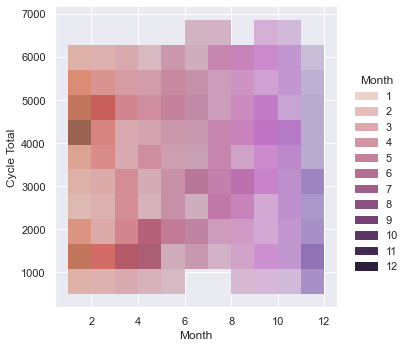

In [143]:
sns.displot(data=dfSumsDaily[['Month', 'Cycle Total', 'Pedestrian Total', 'Season']], 
            x="Month", y='Cycle Total', col='Season', hue='Month');

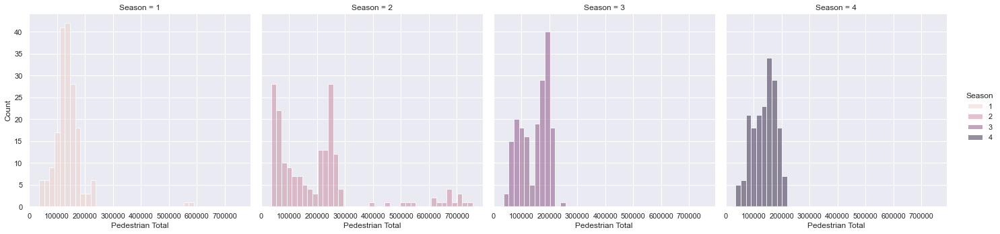

In [134]:
sns.displot(data=dfSumsDaily[['Month', 'Cycle Total', 'Pedestrian Total', 'Season']], 
            x="Pedestrian Total", col='Season', hue='Season');

### Daily Correlations

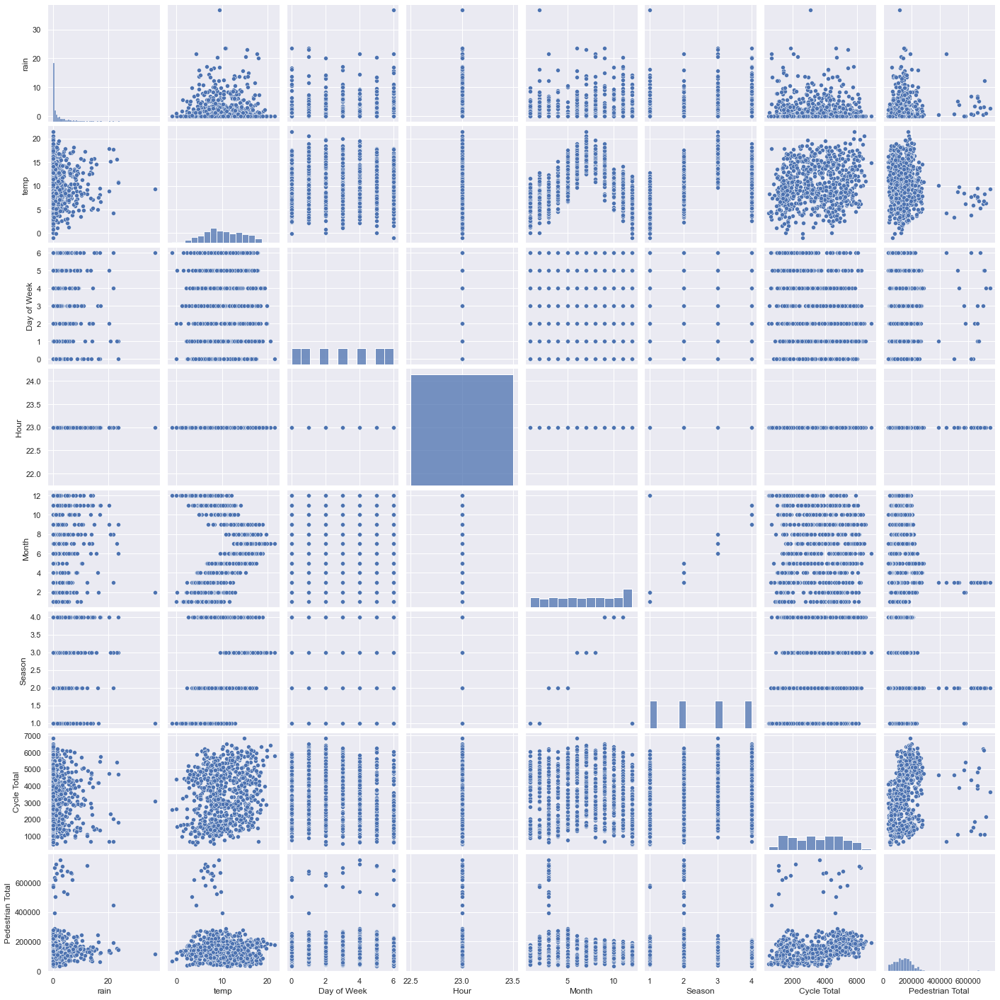

In [109]:
sns.pairplot(data=dfSumsDaily);

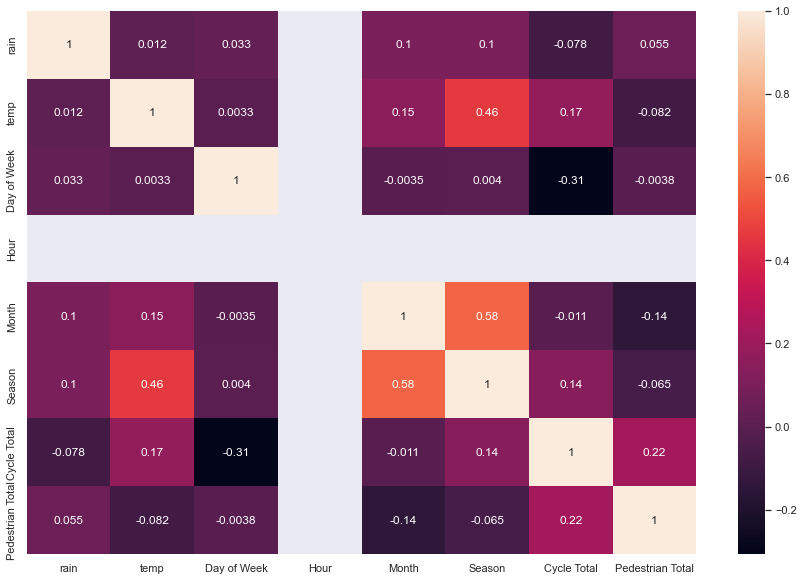

In [110]:
sns.heatmap(dfSumsDaily.corr(), annot=True);

### Daily Distributions

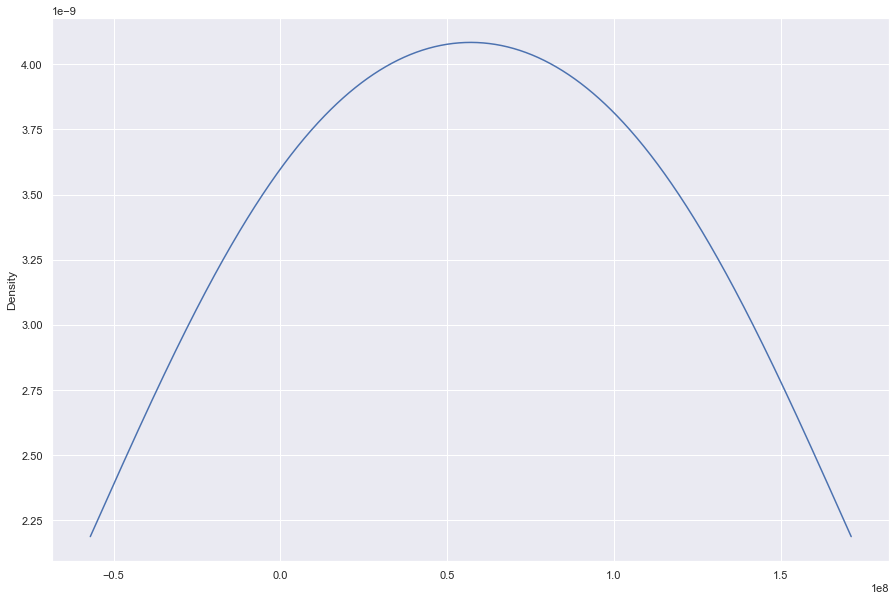

In [111]:
dfSumsDaily[['Pedestrian Total','Hour']].sum().plot(kind='density');

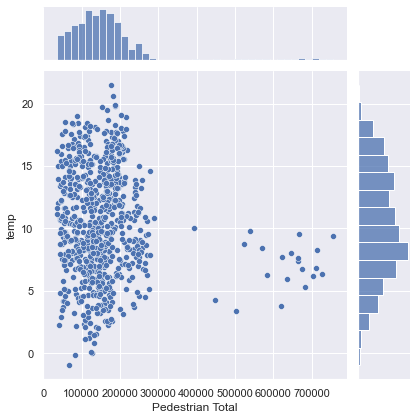

In [112]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp');

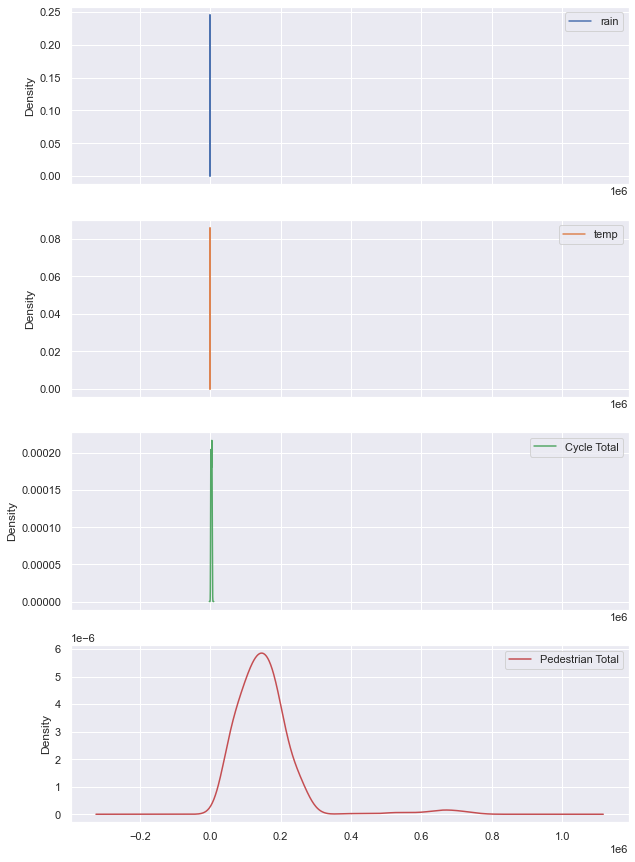

In [113]:
dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']].plot(kind='density', subplots=True, figsize=(10,15));

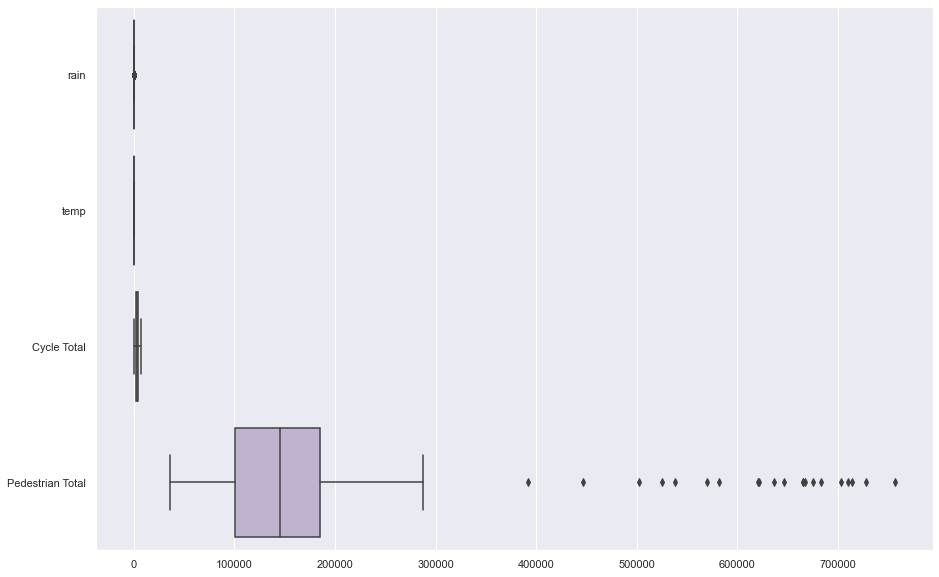

In [114]:
plt.figure(figsize=[15, 10])
sns.boxplot(data=dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']], orient='h', palette='Accent_r');

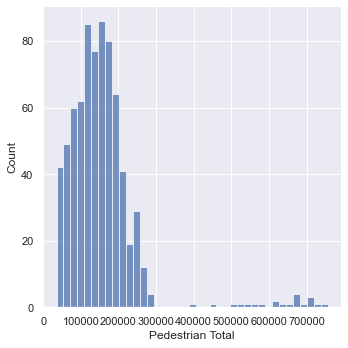

In [115]:
sns.displot(data=dfSumsDaily['Pedestrian Total']);

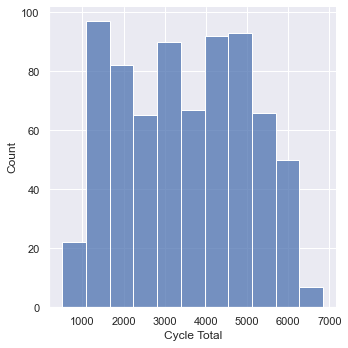

In [116]:
sns.displot(data=dfSumsDaily['Cycle Total']);

### Distribution Comparisons

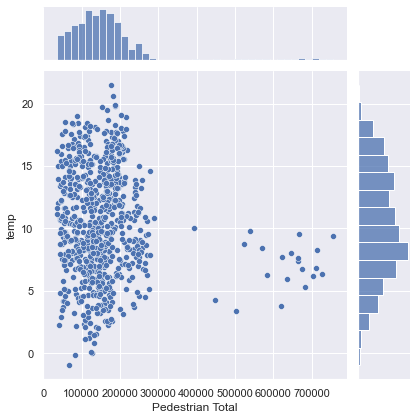

In [117]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp')
plt.xticks(rotation=90)
plt.show();

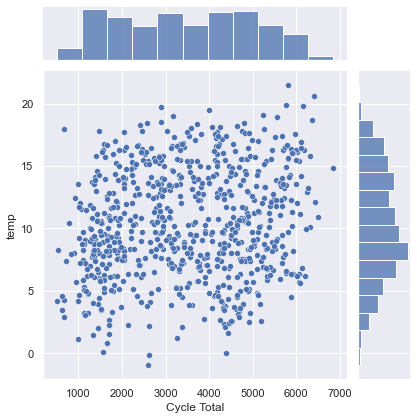

In [118]:
sns.jointplot(data=dfSumsDaily[['Cycle Total','temp']], x='Cycle Total', y='temp');

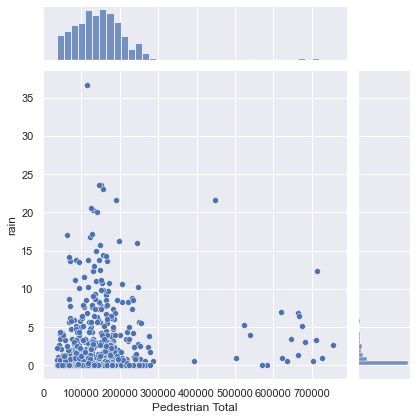

In [119]:
sns.jointplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='Pedestrian Total', y='rain');

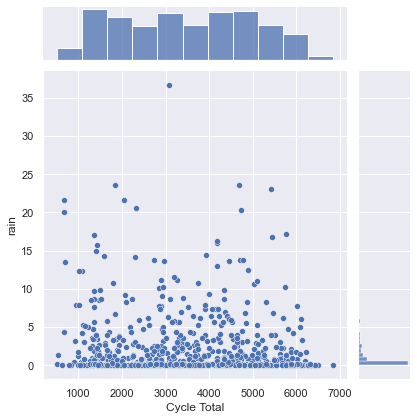

In [120]:
sns.jointplot(data=dfSumsDaily[['Cycle Total','rain']], x='Cycle Total', y='rain');

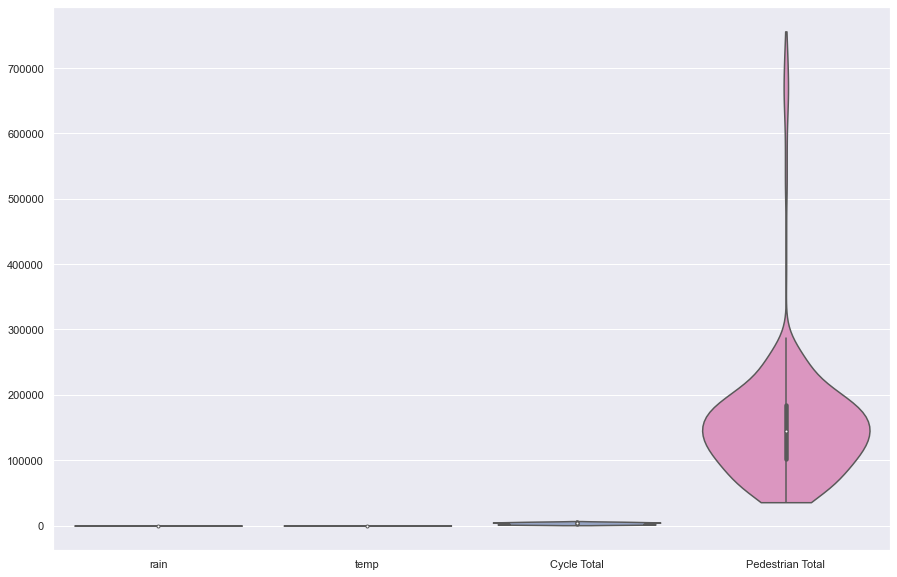

In [121]:
sns.set(rc={'figure.figsize':(15,10)})
sns.violinplot(data=dfSumsDaily[['rain', 'temp','Cycle Total',
       'Pedestrian Total']], scale='width', palette='Set2', #orient='h',
              cut=0);# Cut at my domain no negative count

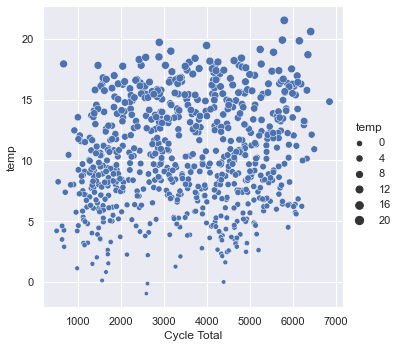

In [122]:
sns.relplot(data=dfSumsDaily[['Cycle Total','temp']], x='Cycle Total', y='temp',size='temp');

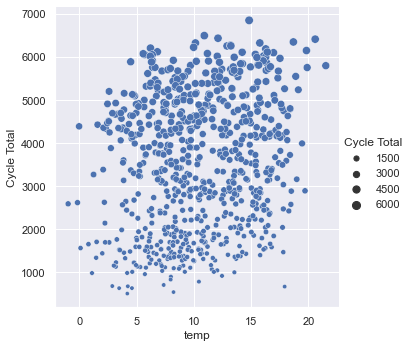

In [123]:
sns.relplot(data=dfSumsDaily[['Cycle Total','temp']], x='temp', y='Cycle Total',size='Cycle Total');

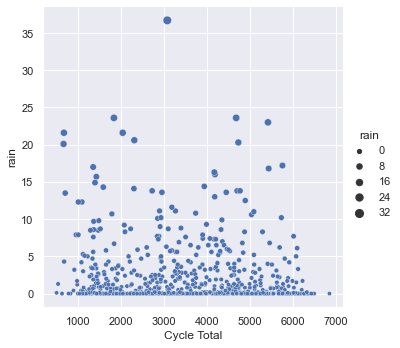

In [124]:
sns.relplot(data=dfSumsDaily[['Cycle Total','rain']], x='Cycle Total', y='rain',size='rain');

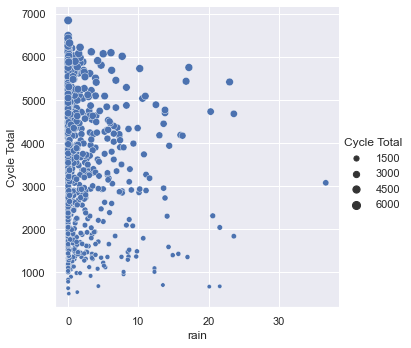

In [125]:
sns.relplot(data=dfSumsDaily[['Cycle Total','rain']], x='rain', y='Cycle Total',size='Cycle Total');

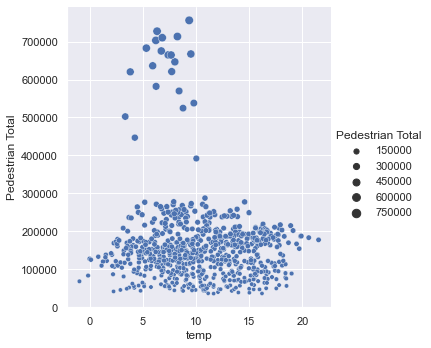

In [126]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='temp', y='Pedestrian Total',size='Pedestrian Total');

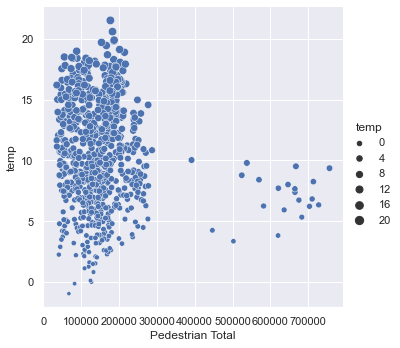

In [127]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','temp']], x='Pedestrian Total', y='temp',size='temp');

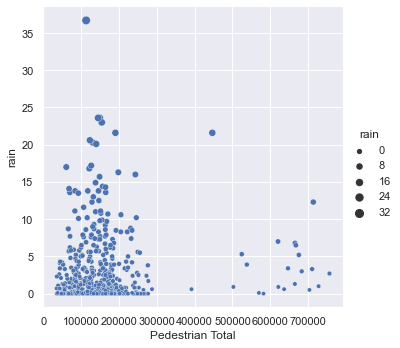

In [128]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='Pedestrian Total', y='rain',size='rain');

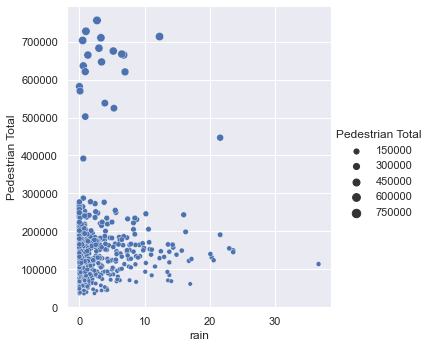

In [129]:
sns.relplot(data=dfSumsDaily[['Pedestrian Total','rain']], x='rain', y='Pedestrian Total',size='Pedestrian Total');

### Line Plots of Daily Sums

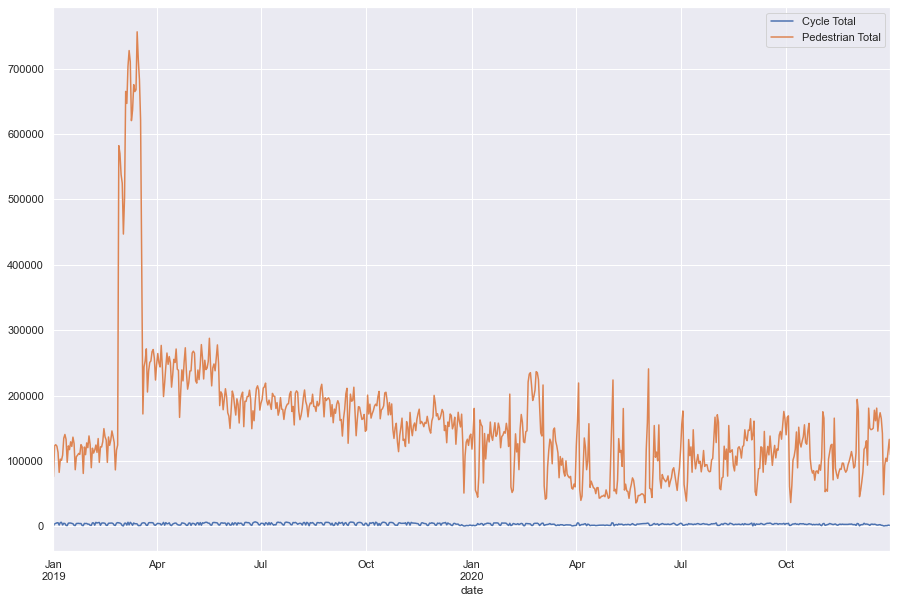

In [130]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total']].plot();

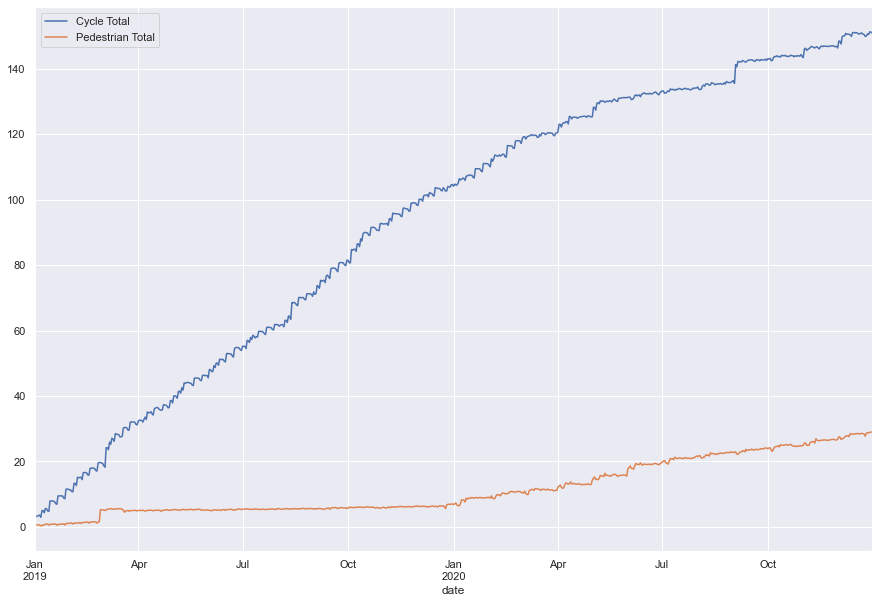

In [131]:
dfSumsDaily[['Cycle Total', 'Pedestrian Total']].pct_change().cumsum().plot();

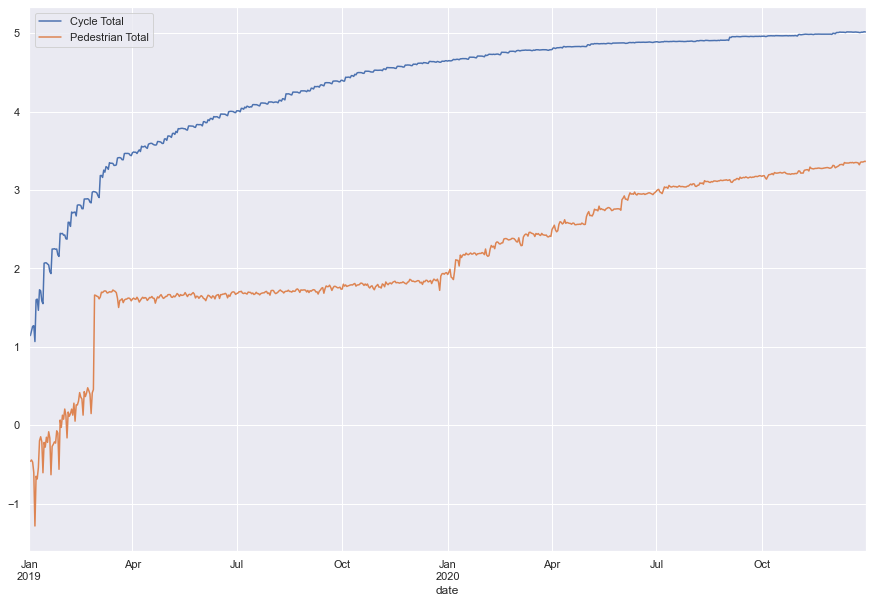

In [132]:
np.log(dfSumsDaily[['Cycle Total', 'Pedestrian Total']].pct_change().cumsum()).plot();

# Machine Learning

In [ ]:
class dataPrep():
    def __init__(self, data, splitSize, scale, label):
        self.label = label
        self.data = data
        self.splitSize = splitSize
        self.scale = scale
        self.yData = self.data[self.label]
        self.XData = self.data
        
    def imputeData(self, impute):
        if impute == 'KNN':
            imputer = KNNImputer(n_neighbors=3)
            impute = imputer.fit_transform(self.data)
            df = pd.DataFrame(impute, columns=self.data.columns)
        elif impute == 'Pandas':
            df = self.data.fillna(method='bfill')
            if df.isnull().values.any():
                df = df.fillna(method='ffill')
        self.data = df
        self.XData = df
        return df
    
    def scaleData(self):
        scaler = StandardScaler()
        self.XData = self.data
        scaled = scaler.fit(self.XData)
        data_scaled = scaled.fit_transform(self.XData)
        self.XData = data_scaled
        return scaled
        
    def splitData(self):
        X_train, X_test, y_train, y_test = train_test_split(self.XData, self.yData, test_size= self.splitSize, shuffle=False)
        return X_train, X_test, y_train, y_test

In [ ]:
class mLModel():
    def __init__(self, params, cv, model, data, splitSize, 
                 inputScaler, label, imputer):
        self.params = params
        self.cv = cv
        self.imputer = imputer
        self.model = model
        self.data = data
        self.splitSize = splitSize
        self.scale = inputScaler
        self.label = label
        self.fittedModel = None
        self.bestParams = None
        
    def transformData(self):
        dataT = dataPrep(self.data, self.splitSize, self.scale, self.label)
        data = dataT.imputeData(self.imputer)
        self.data = data
        if self.scale == 'Standard':
            scaledData = dataT.scaleData()
            X_train, X_test, y_train, y_test = dataT.splitData()
            return X_train, X_test, y_train, y_test
        else:
            X_train, X_test, y_train, y_test = dataT.splitData()
            return X_train, X_test, y_train, y_test
    
    def createModel(self):
        if self.model == 'Ridge':
            model = RandomizedSearchCV(estimator=Ridge(), param_distributions=self.params,
                n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, return_train_score=True, refit=True)
        if self.model == 'RandomForest':
            model = RandomizedSearchCV(estimator=RandomForestRegressor(), param_distributions=self.params, 
                            n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, 
                                return_train_score=True, refit=True)
        if self.model == 'KNN':
            model = RandomizedSearchCV(estimator=KNeighborsRegressor(), param_distributions=self.params,
                n_iter = 20, cv = self.cv, verbose=2, n_jobs=-1, return_train_score=True, refit=True)
        return model
    
    def fitModel(self, model, X_train, y_train):
        fitMod = model.fit(X_train, y_train)
        self.bestParams = fitMod.best_params_
        self.fittedModel = fitMod
        self.score = fitMod.best_score_
        return fitMod
    
    def getMetrics(self, X_train, X_test, y_train, y_test, lossFunction):
        r2 = []
        mse = []
        mae = []
        predTrain = self.fittedModel.predict(X_train)
        predTest = self.fittedModel.predict(X_test)
        for loss in lossFunction:
            if loss == mean_squared_error:
                mse.append(mean_squared_error(y_train, predTrain))
                mse.append(mean_squared_error(y_test, predTest))
            elif loss == r2_score:
                r2.append(r2_score(y_train, predTrain))
                r2.append(r2_score(y_test, predTest))
            if loss == mean_absolute_error:
                mae.append(mean_absolute_error(y_train, predTrain))
                mae.append(mean_absolute_error(y_test, predTest))    
                
        results = pd.DataFrame()
        results['Data Set'] = ['Train','Test']
        results['Label'] = self.label
        results['Scaled'] = self.scale
        results['Imputer'] = self.imputer
        results['Split'] = self.splitSize
        results['MSE'] = mse
        results['MAE'] = mae
        results['R2'] = r2
        results['Model'] = self.model
        results['Best Params'] = str(self.bestParams)
        results['feature importance'] = 'Not Available'
        if self.model == 'RandomForest':
            results.at[0,'feature importance'] = self.fittedModel.best_estimator_.feature_importances_.astype('object')
            results.at[1,'feature importance'] = self.fittedModel.best_estimator_.feature_importances_.astype('object')
        return predTrain, predTest, results
    
    def visualizeResults(self, period, y_test, predTest):
        x_ax = range(len(y_test[:period]))
        plt.scatter(x_ax, y_test[:period], s=5, color="blue", label="original")
        plt.plot(x_ax, predTest[:period], lw=0.8, color="red", label="predicted")
        plt.legend()
        plt.show()

In [ ]:
lossFunction = [mean_squared_error, mean_absolute_error, r2_score] 
totalResults = pd.DataFrame()

In [ ]:
# Random Forest Model Parameters
rfParams = {'bootstrap': [True, False], 
          'max_depth': [10, 20, 100], 
          'max_features': ['sqrt', 'log2'], 
          'n_estimators': [10, 50, 100, 500, 1000, 2000]}

# Ridge Model Parameters
ridgeParams = {'alpha': [0.001, 0.01, 0.1, 1, 5, 10], 
          'normalize': [True, False]}

# Lasso Model Parameters
knnParams = {'n_neighbors': [2, 3, 5, 7, 10], 
          'leaf_size': [20, 30, 40, 50],
              'p': [1, 2]}

In [ ]:
count = 1
total = len(predict) * len(scalers) * len(imputers) * len(models) * len(splitSizes)
for mod in models:
    for pre in predict:
        for sca in scalers:
            for spl in splitSizes:
                for imp in imputers:
                    data = df.copy()
                    valData = df2021.copy()
                    if mod == 'KNN':
                        p = knnParams
                    elif mod == 'Ridge':
                        p = ridgeParams
                    elif mod == 'RandomForest':
                        p = rfParams
                    if pre == 'Cycle Total':
                        data.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                                           'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
                                  axis=1, inplace=True)
                        valData.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                                           'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
                                  axis=1, inplace=True)
                    elif pre == 'Pedestrian Total':
                        data.drop(columns=["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",'Aston Quay', 
                                           'Grafton Street @ CompuB', 'Talbot Street North', 'Doilier Street, Burgh Quay', 
                                           'Dawson Street Replacement', 'Talbot Street South', 
                                           "O'Connell St, Parnell St @ AIB", 'Grafton Street / Nassau Street / Suffolk Street',
                                           'College Green, Bank Of Ireland', 'Henry Street', 'Westmoreland Street East', 
                                           'Liffey Street', 'Westmoreland Street West', 'Grafton Street', 'Bachelors Walk',
                                           'College Green @ Church Lane', 'College Green - Dame St Side'],
                                  axis=1, inplace=True)
                        valData.drop(columns=["O'Connell St Outside Pennys", "O'Connell St Outside Clerys",'Aston Quay', 
                                           'Grafton Street @ CompuB', 'Talbot Street North', 'Doilier Street, Burgh Quay', 
                                           'Dawson Street Replacement', 'Talbot Street South', 
                                           "O'Connell St, Parnell St @ AIB", 'Grafton Street / Nassau Street / Suffolk Street',
                                           'College Green, Bank Of Ireland', 'Henry Street', 'Westmoreland Street East', 
                                           'Liffey Street', 'Westmoreland Street West', 'Grafton Street', 'Bachelors Walk',
                                           'College Green @ Church Lane', 'College Green - Dame St Side'],
                                  axis=1, inplace=True)
                    
                    # Create machine learning class
                    randomSearch = mLModel(params=p, cv=5, model=mod,
                                                       data=data, splitSize=spl, inputScaler=sca, 
                                                label=pre, imputer=imp)
                    # Split the dataset
                    X_train, X_test, y_train, y_test = randomSearch.transformData()
                    
                    # Create the model 
                    model = randomSearch.createModel()

                    # Fit the model and test 
                    randomSearch.fitModel(model, X_train, y_train)
                    
                    # Get metrics
                    predTrain, predTest, results = randomSearch.getMetrics(X_train, X_test, y_train,
                                                                y_test, lossFunction)
                    
                    dataX = dataPrep(valData, spl, sca, pre)
                    dataX.imputeData(imp)
                    dataX.scaleData()
                    
                    pred2021 = randomSearch.fittedModel.predict(dataX.XData)
                    
                    y = valData[[pre]]
                    results.loc[len(results.index)] = ['Validation Data', pre, sca, imp, spl, 
                                                       mean_squared_error(y, pred2021),
                        mean_absolute_error(y, pred2021),r2_score(y, pred2021), mod, 'NA', 'NA']
                    totalResults = pd.concat([totalResults, results], axis=0)
                    
                    print('Completed {}%'.format(round((count / total)*100,2)))
                    count += 1

# All Results

In [ ]:
totalResults[(totalResults.R2 > 0.7) & (totalResults['Data Set'] == 'Validation Data')]

In [ ]:
totalResults.to_csv('TotalResults2732022.csv', index=False)

dataVal = df2021.copy()
dataX = dataPrep(dataVal, spl, sca, pre)
dataX.imputeData(imp)

dataX.data.drop(columns=['Grove Road Totem', 'North Strand Rd S/B',
                   'North Strand Rd N/B', 'Charleville Mall', 'Guild Street'], 
          axis=1, inplace=True)

dataX.scaleData()

y = dataVal[[pre]]

pred2021 = randomSearch.fittedModel.predict(dataX.XData)

r2_score(y, pred2021)

results.loc[len(results.index)] = ['Validation Data', pre, sca, imp, spl, mean_squared_error(y, pred2021),
    mean_absolute_error(y, pred2021),r2_score(y, pred2021), mod, 'NA', 'NA']
results

results = pd.read_csv('TotalResults2632022.csv')
results